In [2]:
import pandas as pd
import numpy as np

from datetime import datetime as dt
import datetime
from dateutil.relativedelta import relativedelta

from tqdm import tqdm_notebook
import tqdm

import pickle

import os
import warnings

warnings.filterwarnings('ignore')

In [3]:
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams['axes.axisbelow'] = True

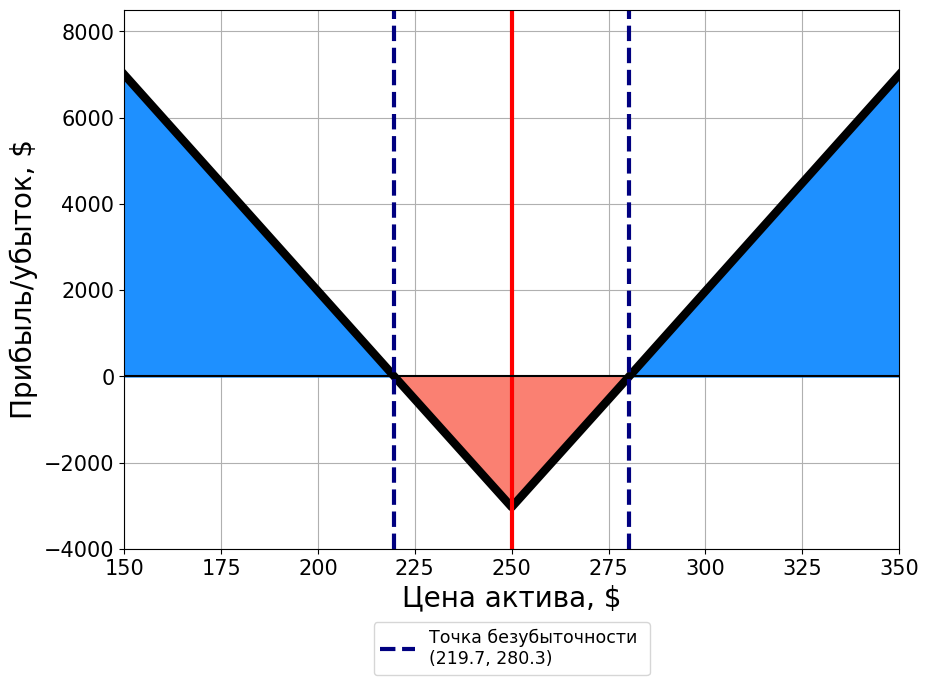

In [4]:
x = np.array([150, 219.7, 250, 280.3, 350])
y = np.array([7000, 0, -3030, 0, 7000])

x1 = np.linspace(150, 219.7, 100)
profit_1 = -100.4 * x1 + 22065

x2 = np.linspace(280.3, 350, 100)
profit_2 = 100.4 * x2 - 28151

x3 = np.linspace(219.7, 250, 100)
profit_3 = -100.0 * x3 + 21970

x4 = np.linspace(250, 280.3, 100)
profit_4 = 100.0 * x4 - 28030

plt.figure(figsize = (10, 7))
plt.plot(x, y, color = 'black', linewidth = 6)
plt.grid()
plt.ylim((-4e3, 8.5e3))
plt.axvline((219.7), color = 'navy', linestyle = 'dashed', linewidth = 3, label = 'Точка безубыточности \n(219.7, 280.3)')
plt.axvline((280.3), color = 'navy', linestyle = 'dashed', linewidth = 3)
plt.axvline((250), color = 'red', linewidth = 3)
plt.axhline((0), color = 'black', linewidth = 1.5)
plt.fill_between(x1, profit_1, np.zeros(x1.shape[0]), color = 'dodgerblue', alpha = 1)
plt.fill_between(x2, profit_2, np.zeros(x2.shape[0]), color = 'dodgerblue', alpha = 1)
plt.fill_between(x3, profit_3, np.zeros(x3.shape[0]), color = 'salmon', alpha = 1)
plt.fill_between(x4, profit_4, np.zeros(x4.shape[0]), color = 'salmon', alpha = 1)
plt.legend(fontsize = 12.5, loc = 'lower center', bbox_to_anchor = (0.5, -0.25), ncol = 1)
plt.tick_params(labelsize = 15)
plt.xlabel('Цена актива, $', fontsize = 20)
plt.ylabel('Прибыль/убыток, $', fontsize = 20)
plt.xlim((150, 350))
plt.savefig('long_straddle_2.png', bbox_inches = 'tight')
plt.show()

In [9]:
def call_payoff(asset_price, strike, call_price, put_price):
    
    return (np.maximum((asset_price - strike), 0) - call_price - put_price) #* 100

def put_payoff(asset_price, strike, put_price, call_price):
    
    return (np.maximum(strike - asset_price, 0)  - call_price - put_price) #* 100

call_price, put_price, strike = 205, 230, 27000
price = 26958

break_even_1 = 205 + 230 + strike
break_even_2 = strike - 230 - 205

x_call_1 = np.linspace(break_even_1, 28500, 1000)
x_put_1 = np.linspace(25500, break_even_2, 1000)

y_call_1 = call_payoff(x_call_1, strike, call_price, put_price)
y_put_1 = put_payoff(x_put_1, strike, put_price, call_price)

x_call_2 = np.linspace(strike, break_even_1, 1000)
y_call_2 = call_payoff(x_call_2, strike, call_price, put_price)

x_put_2 = np.linspace(break_even_2, strike, 1000)
y_put_2 = put_payoff(x_put_2, strike, put_price, call_price)

x1 = np.linspace(break_even_1, 29000, 1000)
profit_1 = x1 - break_even_1

x2 = np.linspace(24975, break_even_2, 1000)
profit_2 = -x2 + break_even_2

x3 = np.linspace(strike, break_even_1, 1000)
profit_3 = x3 - break_even_1

x4 = np.linspace(break_even_2, strike, 1000)
profit_4 = -x4 + break_even_2



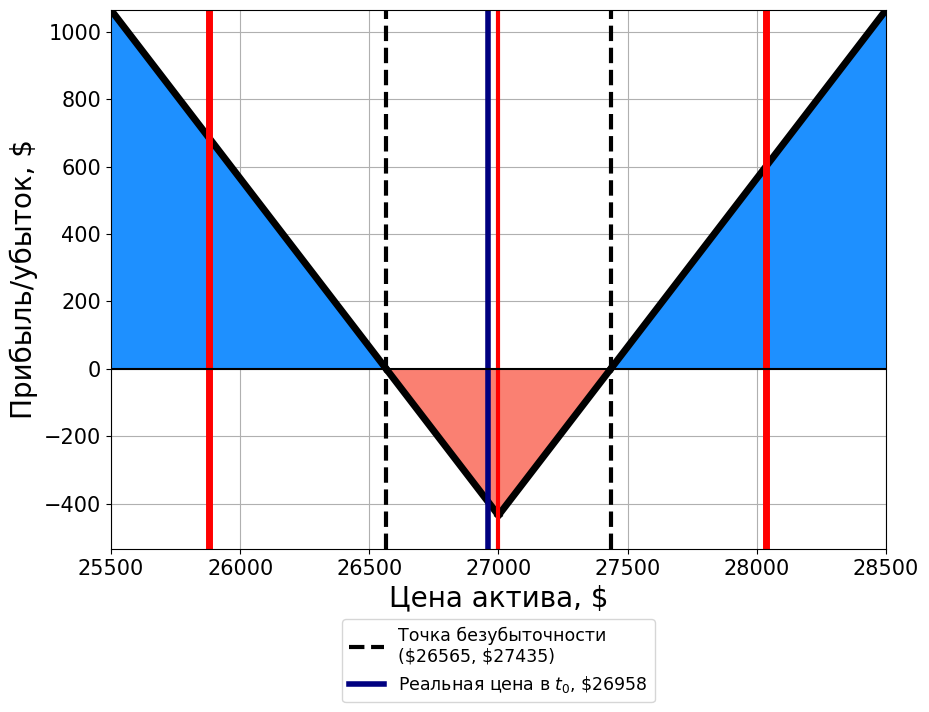

In [12]:
plt.figure(figsize = (10, 7))
plt.plot(x_call_1, y_call_1, color = 'black', linewidth = 5)
plt.plot(x_call_2, y_call_2, color = 'black', linewidth = 5)
plt.plot(x_put_1, y_put_1, color = 'black', linewidth = 5)
plt.plot(x_put_2, y_put_2, color = 'black', linewidth = 5)
plt.grid()
plt.ylim((y_put_2.min()-100, y_call_1.max()))
plt.axvline((break_even_2), color = 'black', linestyle = 'dashed', linewidth = 3, label = f'Точка безубыточности \n(\${break_even_2}, \${break_even_1})')
plt.axvline((break_even_1), color = 'black', linestyle = 'dashed', linewidth = 3)
plt.axvline((price), color = 'navy', linewidth = 4, label = f'Реальная цена в $t_0$, \${price}')
plt.axvline((strike), color = 'red', linewidth = 3)
plt.axvline((price*0.96), color = 'red', linewidth = 5)
plt.axvline((price*1.04), color = 'red', linewidth = 5)
plt.axhline((0), color = 'black', linewidth = 1.5)
plt.fill_between(x1, profit_1, np.zeros(x1.shape[0]), color = 'dodgerblue', alpha = 1)
plt.fill_between(x2, profit_2, np.zeros(x2.shape[0]), color = 'dodgerblue', alpha = 1)
plt.fill_between(x3, profit_3, np.zeros(x3.shape[0]), color = 'salmon', alpha = 1)
plt.fill_between(x4, profit_4, np.zeros(x4.shape[0]), color = 'salmon', alpha = 1)
plt.legend(fontsize = 12.5, loc = 'lower center', bbox_to_anchor = (0.5, -0.3), ncol = 1)
plt.tick_params(labelsize = 15)
plt.xlabel('Цена актива, $', fontsize = 20)
plt.ylabel('Прибыль/убыток, $', fontsize = 20)
plt.xlim((x_put_1.min(), x_call_1.max()))
plt.savefig('for presentation long_straddle_2.png', bbox_inches = 'tight')
plt.show()

In [5]:
freq = 1
pair = 'BTCEUR'

sw_lasso_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')

pair = 'BTCUSDT'

sw_lasso_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')

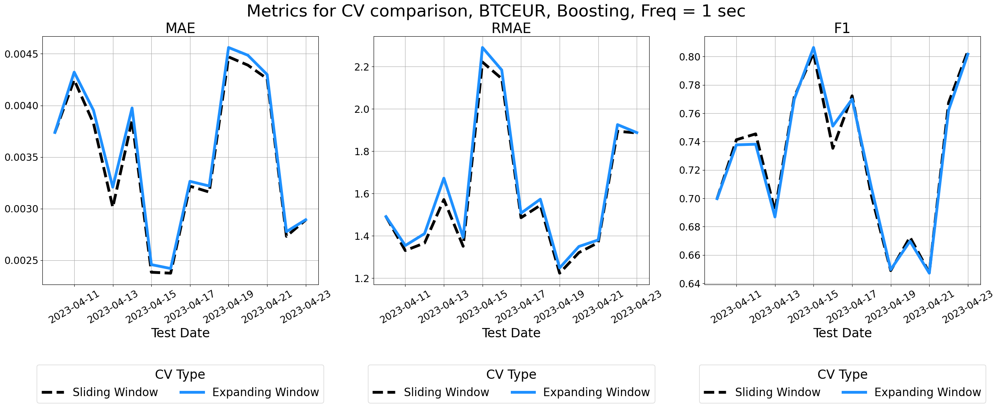

In [448]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCEUR, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCEUR, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

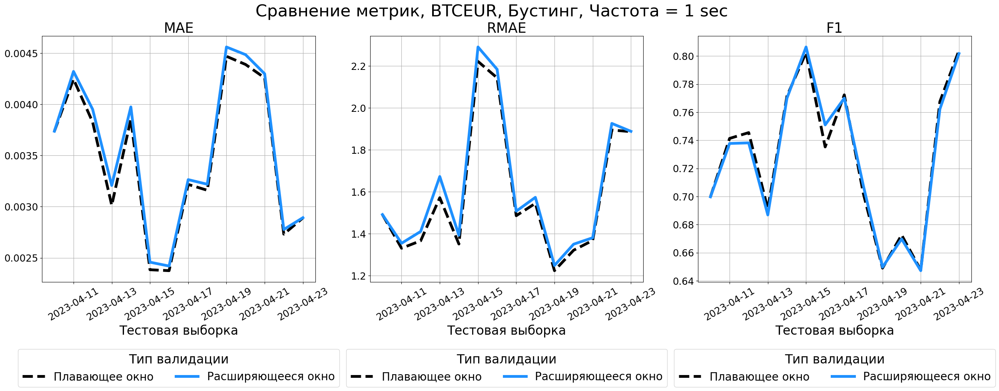

In [9]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Плавающее окно', ax = ax[0])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Расширяющееся окно', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Плавающее окно', ax = ax[1])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Расширяющееся окно', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Плавающее окно', ax = ax[2])
sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Расширяющееся окно', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Тип валидации', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик, BTCEUR, Бустинг, Частота = {freq} sec', fontsize = 30)
plt.savefig(f'For Presentation Metrics for CV comparison, BTCEUR, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

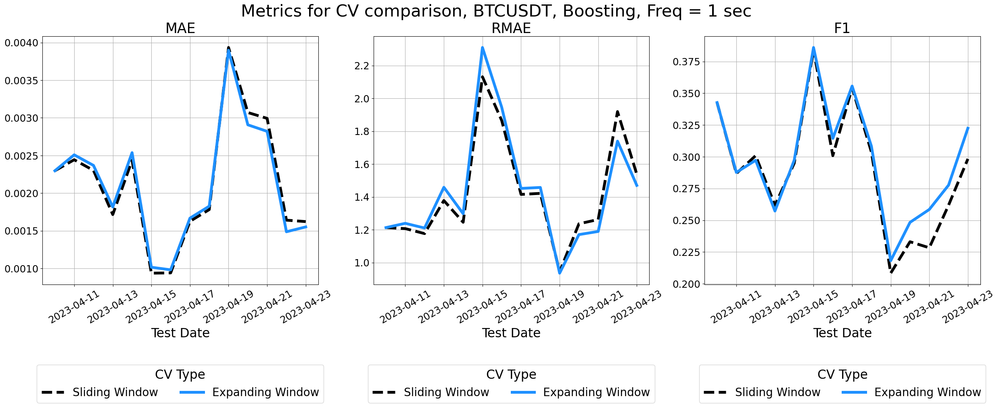

In [449]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCUSDT, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCUSDT, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

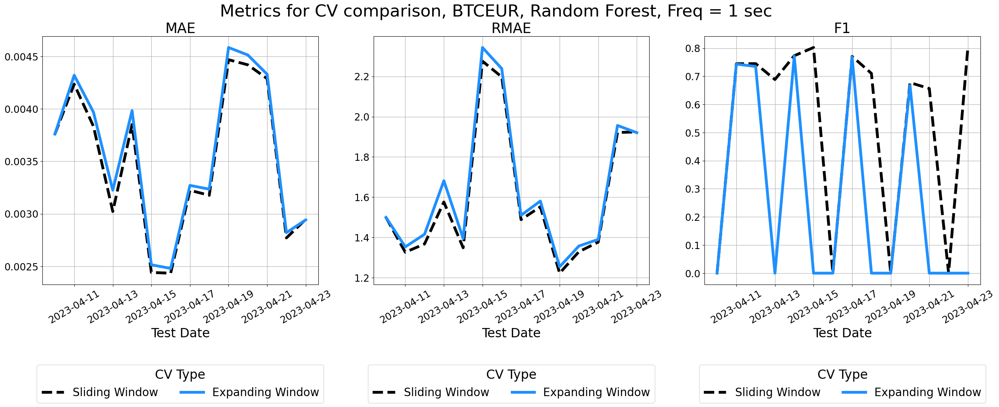

In [450]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCEUR, Random Forest, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCEUR, Random Forest, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

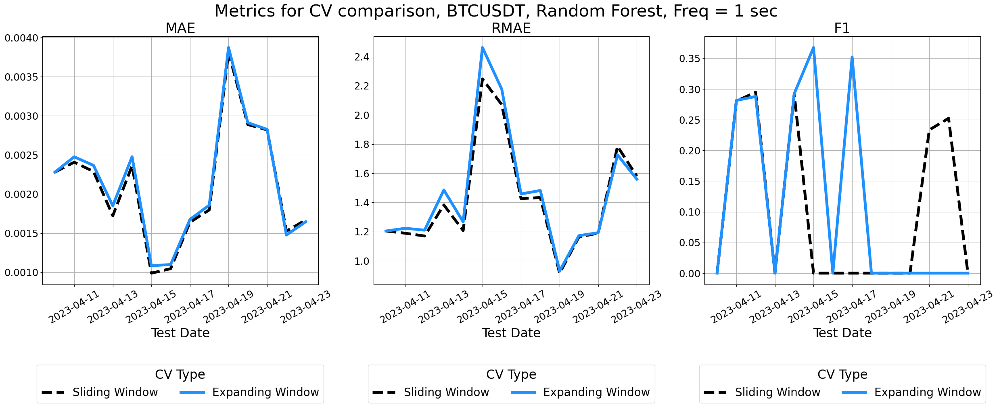

In [451]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCUSDT, Random Forest, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCUSDT, Random Forest, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

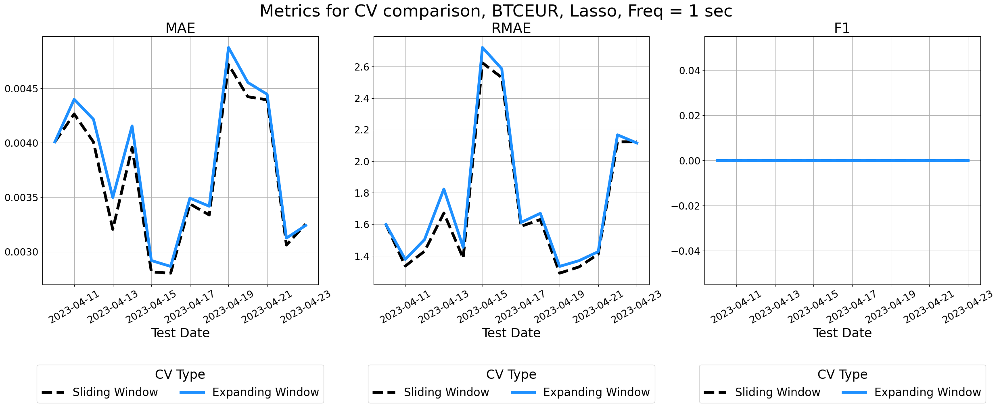

In [452]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCEUR, Lasso, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCEUR, Lasso, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

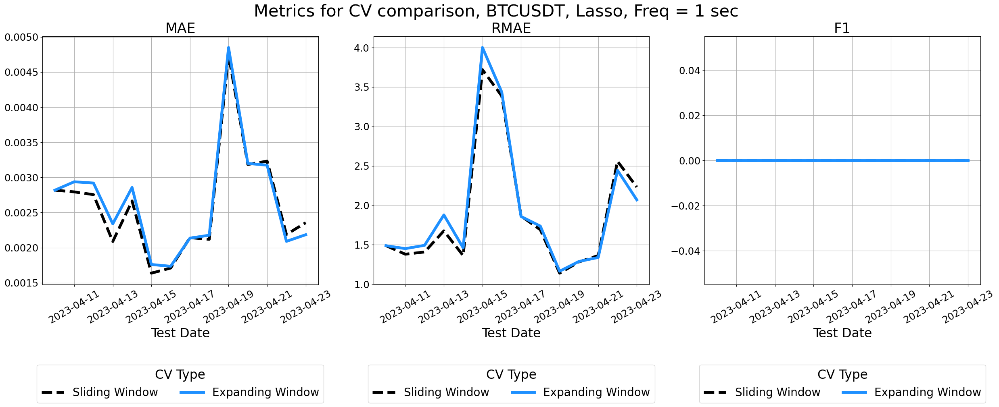

In [453]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[0])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[0])

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[1])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[1])

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Sliding Window', ax = ax[2])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Expanding Window', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for CV comparison, BTCUSDT, Lasso, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for CV comparison, BTCUSDT, Lasso, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

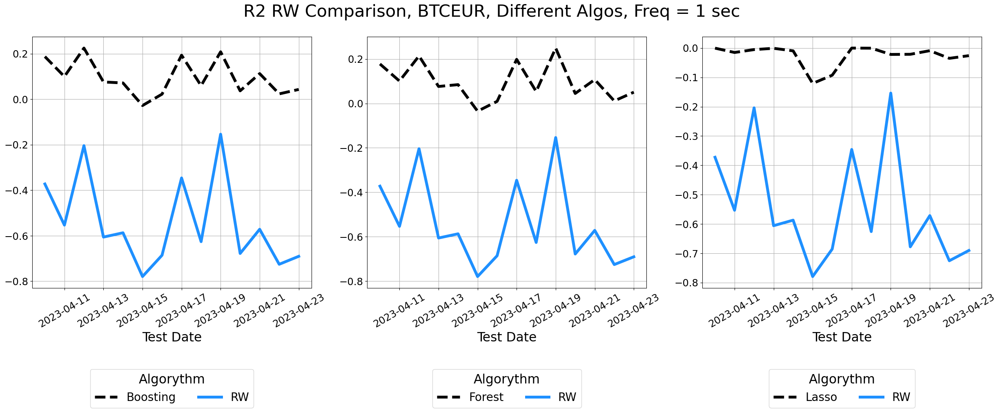

In [454]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[0])

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Forest', ax = ax[1])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[1])

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Lasso', ax = ax[2])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

plt.suptitle(f'R2 RW Comparison, BTCEUR, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'R2 RW COmparison, BTCEUR, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

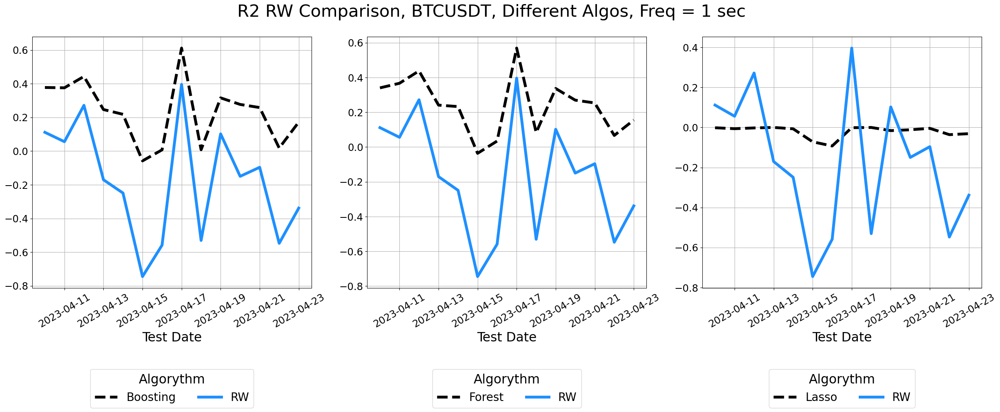

In [455]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[0])

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Forest', ax = ax[1])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[1])

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Lasso', ax = ax[2])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'RW', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

plt.suptitle(f'R2 RW Comparison, BTCUSDT, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'R2 RW COmparison, BTCUSDT, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

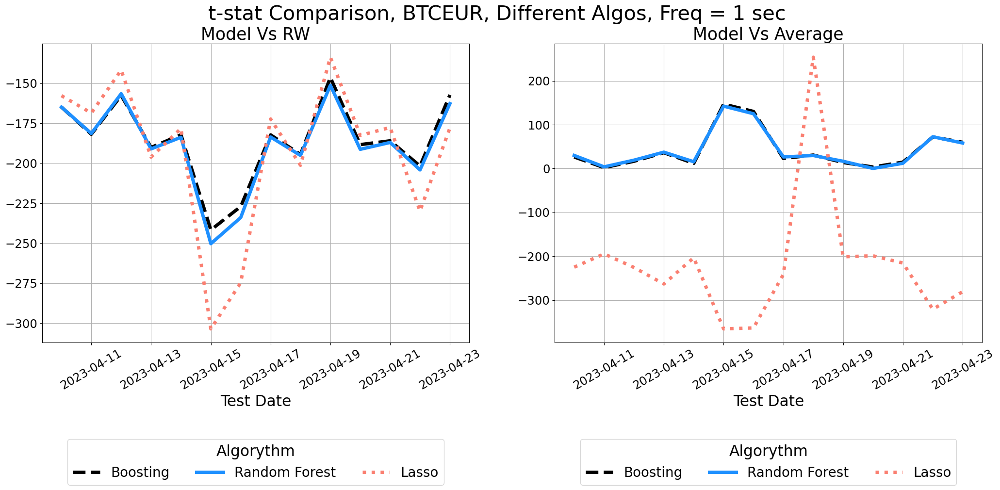

In [456]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'tstat_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'tstat_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'tstat_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'tstat_avg', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'tstat_avg', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'tstat_avg', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    
ax[0].set_title('Model Vs RW', fontsize = 25)
ax[1].set_title('Model Vs Average', fontsize = 25)

plt.suptitle(f't-stat Comparison, BTCEUR, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f't-stat COmparison, BTCEUR, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

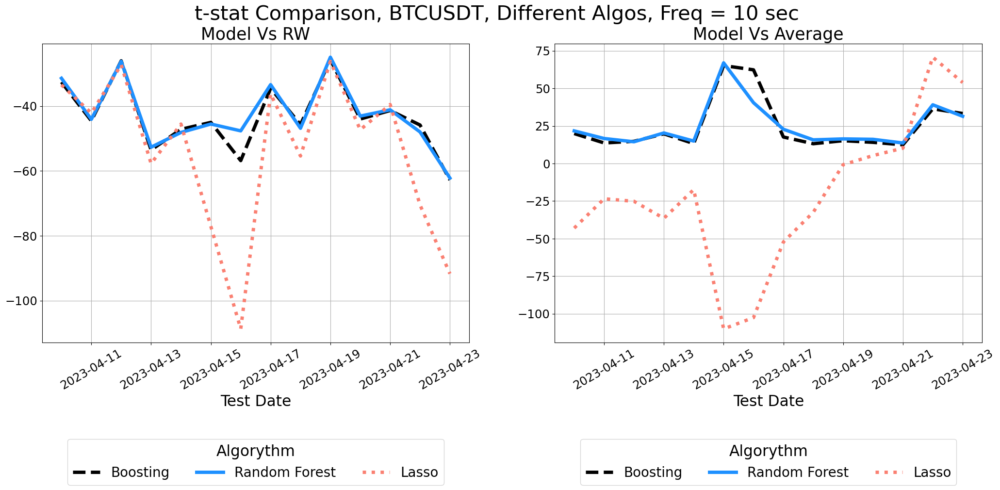

In [325]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'tstat_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'tstat_rw', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'tstat_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'tstat_avg', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'tstat_avg', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'tstat_avg', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    
ax[0].set_title('Model Vs RW', fontsize = 25)
ax[1].set_title('Model Vs Average', fontsize = 25)

plt.suptitle(f't-stat Comparison, BTCUSDT, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f't-stat COmparison, BTCUSDT, Different Algos, Freq {freq} sec.pdf', bbox_inches = 'tight')
plt.show()

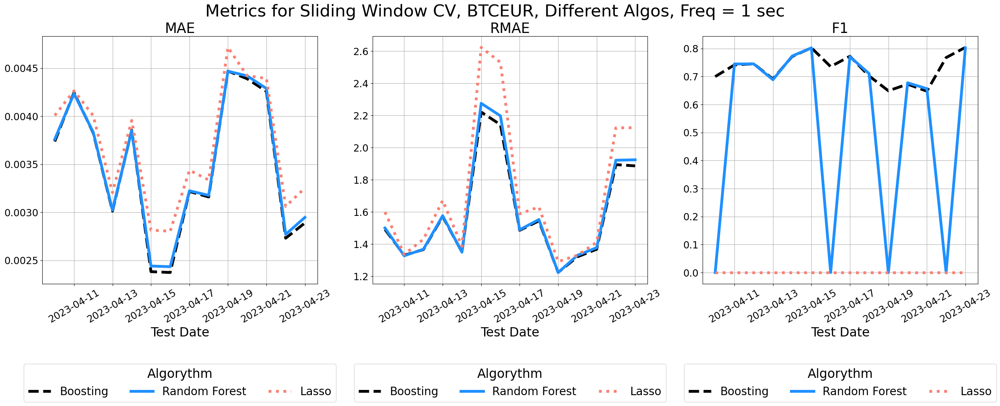

In [457]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[2])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[2])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Sliding Window CV, BTCEUR, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Sliding Window CV, BTCEUR, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

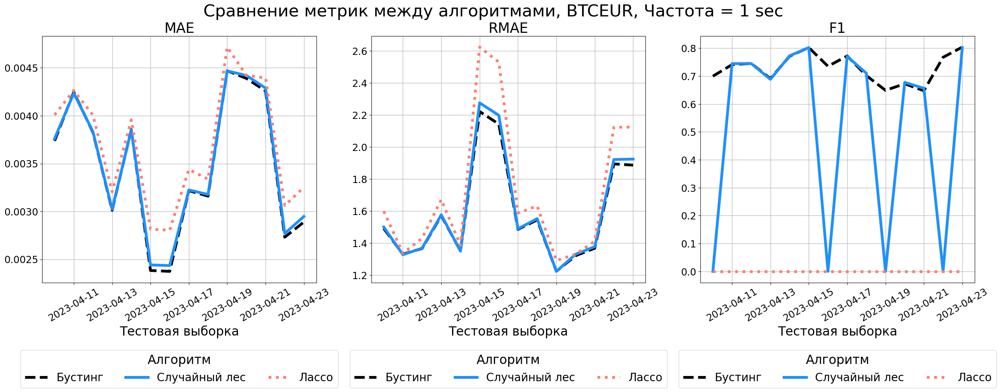

In [8]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Бустинг', ax = ax[0])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Случайный лес', ax = ax[0])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Лассо', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Бустинг', ax = ax[1])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Случайный лес', ax = ax[1])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Лассо', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Бустинг', ax = ax[2])
sns.lineplot(data = sw_forest_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Случайный лес', ax = ax[2])
sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Лассо', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Алгоритм', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик между алгоритмами, BTCEUR, Частота = {freq} sec', fontsize = 30)
plt.savefig(f'For Presentation Metrics for Sliding Window CV, BTCEUR, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

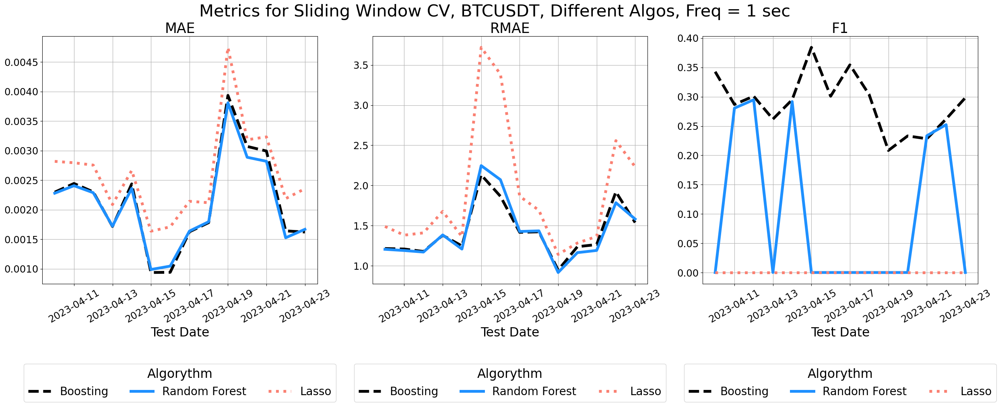

In [458]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[2])
sns.lineplot(data = sw_forest_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[2])
sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Sliding Window CV, BTCUSDT, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Sliding Window CV, BTCUSDT, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

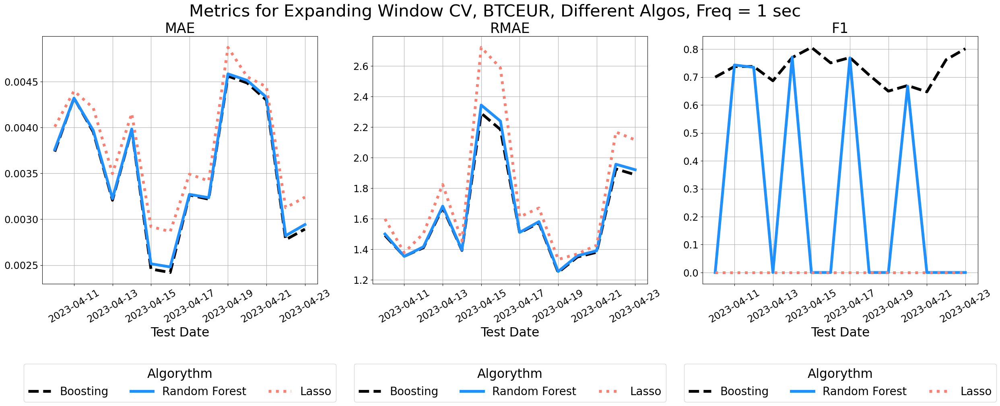

In [459]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[2])
sns.lineplot(data = ew_forest_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[2])
sns.lineplot(data = ew_lasso_eur, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Expanding Window CV, BTCEUR, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Expanding Window CV, BTCEUR, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

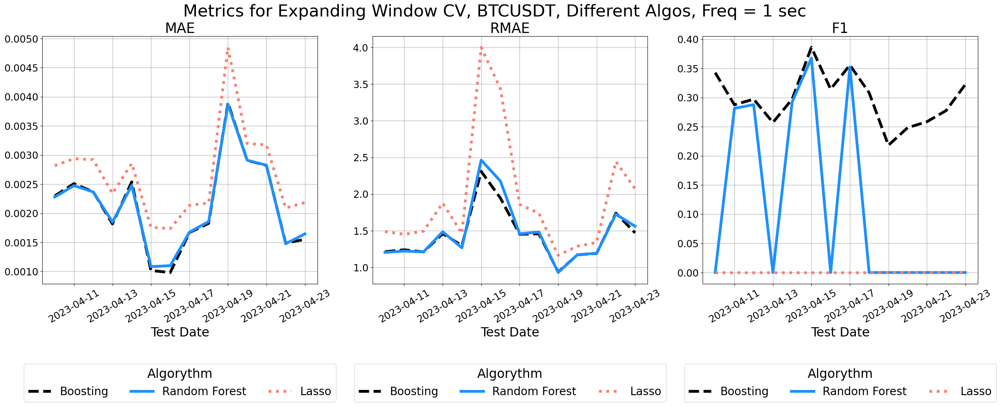

In [460]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[0])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[0])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[0])

sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[1])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[1])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[1])

sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Boosting', ax = ax[2])
sns.lineplot(data = ew_forest_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Random Forest', ax = ax[2])
sns.lineplot(data = ew_lasso_usd, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = 'Lasso', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Algorythm', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Expanding Window CV, BTCUSDT, Different Algos, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Expanding Window CV, BTCUSDT, Different Algos, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

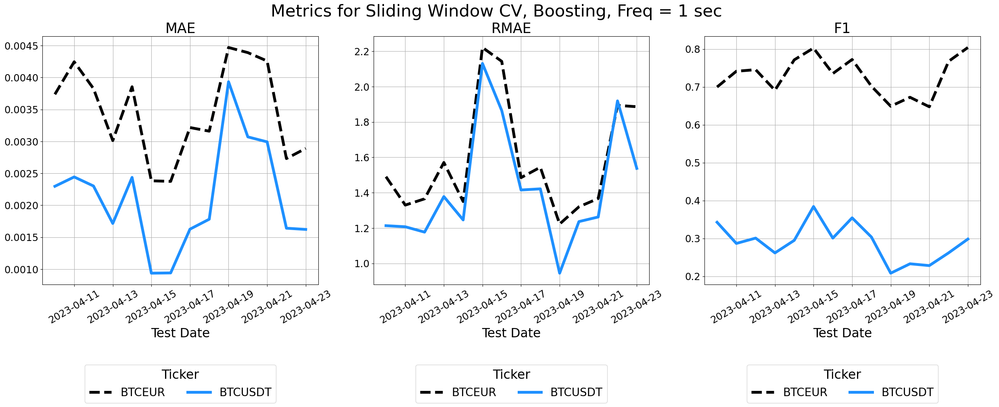

In [461]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[0])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[1])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[2])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Sliding Window CV, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Sliding Window CV, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

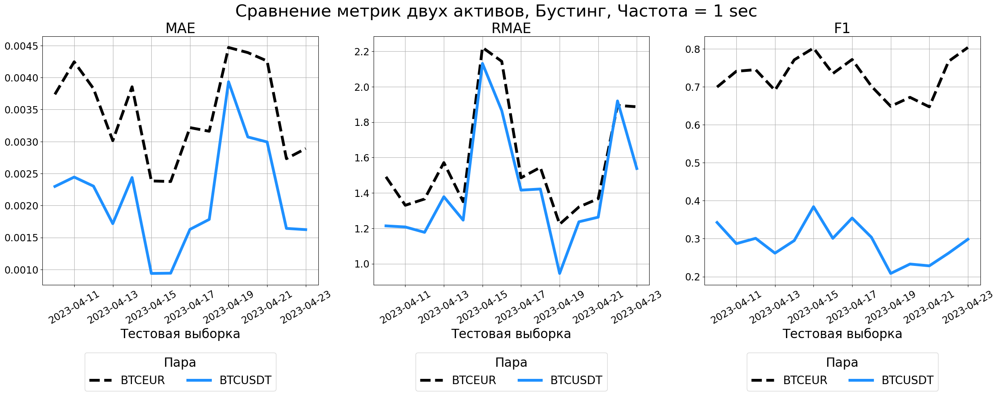

In [10]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[0])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[1])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[2])
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Пара', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик двух активов, Бустинг, Частота = {freq} sec', fontsize = 30)
plt.savefig(f'For Presentation Metrics for Sliding Window CV, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

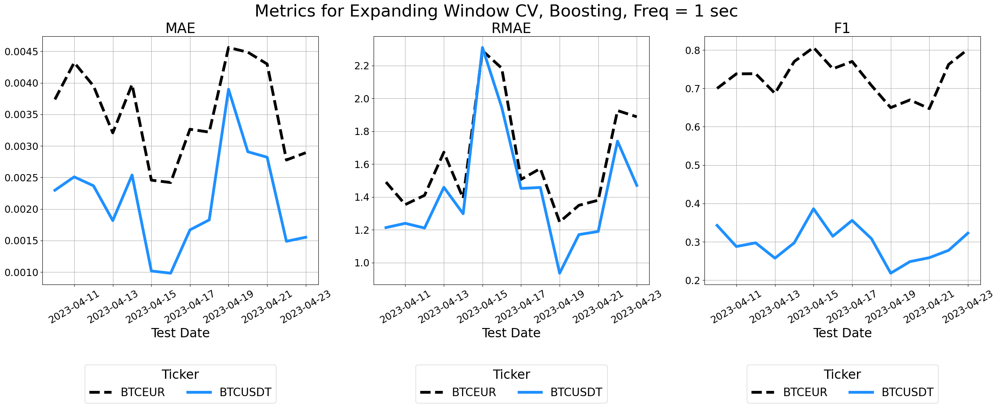

In [462]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[0])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[0])

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[1])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[1])

sns.lineplot(data = ew_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'BTCEUR', ax = ax[2])
sns.lineplot(data = ew_boosting_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'BTCUSDT', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Expanding Window CV, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Metrics for Expanding Window CV, Boosting, Freq {freq} sec.png', bbox_inches = 'tight')
plt.show()

In [11]:
pair = 'BTCEUR'

sw_lasso_eur_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_LASSO.xlsx')
sw_boosting_eur_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_BOOSTING.xlsx')
sw_forest_eur_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_RF.xlsx')

sw_lasso_eur_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_LASSO.xlsx')
sw_boosting_eur_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_BOOSTING.xlsx')
sw_forest_eur_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_RF.xlsx')

sw_lasso_eur_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_LASSO.xlsx')
sw_boosting_eur_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_BOOSTING.xlsx')
sw_forest_eur_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_RF.xlsx')

pair = 'BTCUSDT'

sw_lasso_usd_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_LASSO.xlsx')
sw_boosting_usd_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_BOOSTING.xlsx')
sw_forest_usd_1 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ1_RF.xlsx')

sw_lasso_usd_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_LASSO.xlsx')
sw_boosting_usd_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_BOOSTING.xlsx')
sw_forest_usd_5 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ5_RF.xlsx')

sw_lasso_usd_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_LASSO.xlsx')
sw_boosting_usd_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_BOOSTING.xlsx')
sw_forest_usd_10 = pd.read_excel(f'SW_{pair}_RESULTS_FREQ10_RF.xlsx')

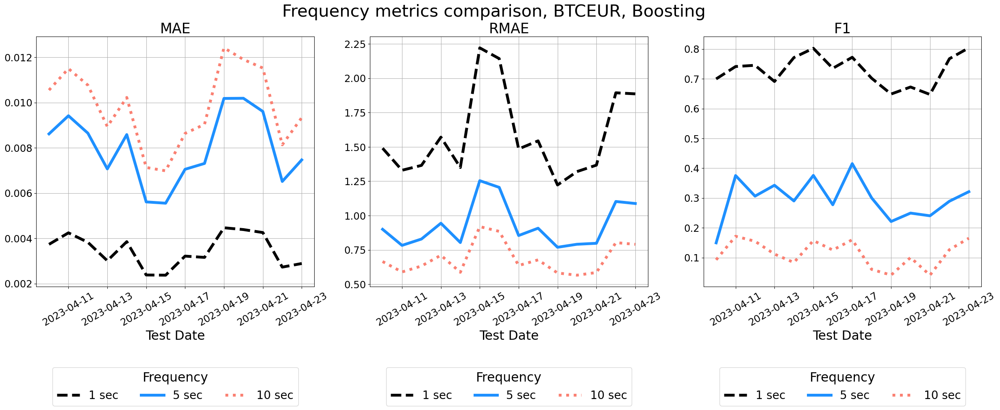

In [402]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCEUR, Boosting', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCEUR, Boosting.png', bbox_inches = 'tight')
plt.show()

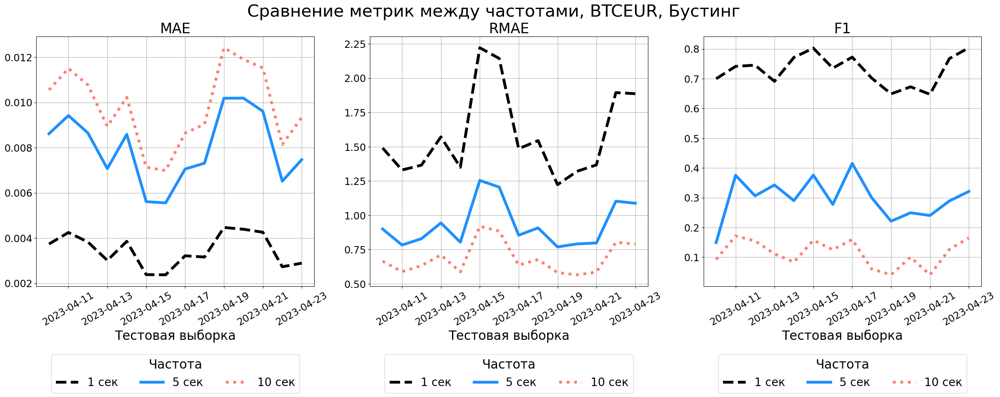

In [12]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[0])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[1])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Частота', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик между частотами, BTCEUR, Бустинг', fontsize = 30)
plt.savefig(f'For Presentation Frequency metrics comparison, BTCEUR, Boosting.png', bbox_inches = 'tight')
plt.show()

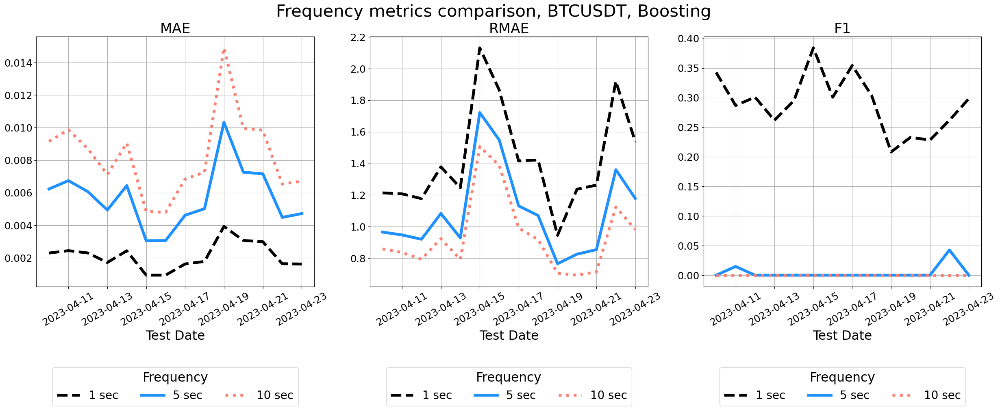

In [403]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCUSDT, Boosting', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCUSDT, Boosting.png', bbox_inches = 'tight')
plt.show()

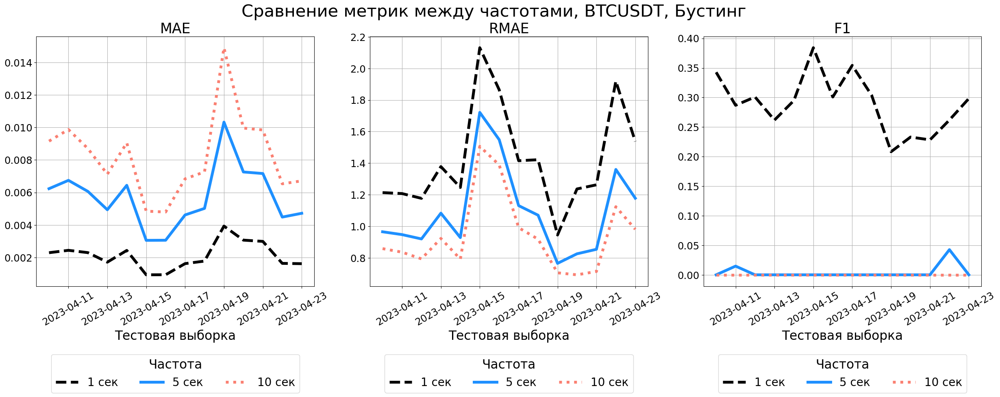

In [13]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[0])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[1])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 сек', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 сек', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Частота', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик между частотами, BTCUSDT, Бустинг', fontsize = 30)
plt.savefig(f'For Presentation Frequency metrics comparison, BTCUSDT, Boosting.png', bbox_inches = 'tight')
plt.show()

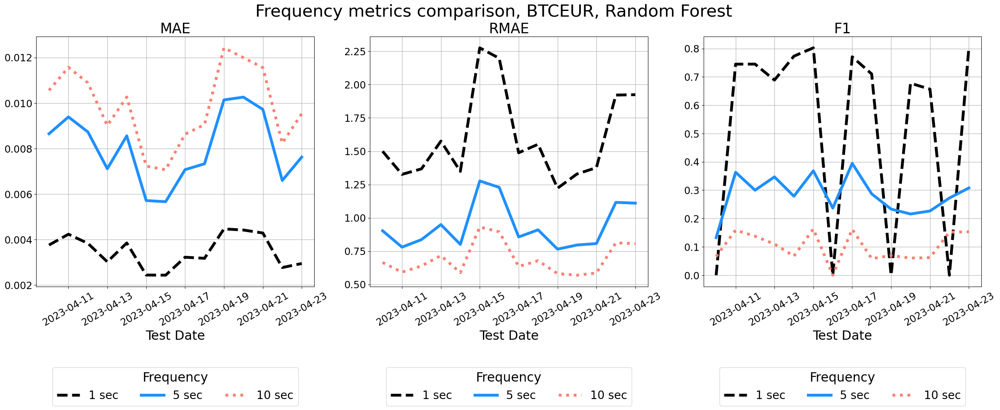

In [404]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_eur_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_forest_eur_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_forest_eur_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_forest_eur_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_forest_eur_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_forest_eur_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_forest_eur_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_forest_eur_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_forest_eur_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCEUR, Random Forest', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCEUR, Random Forest.png', bbox_inches = 'tight')
plt.show()

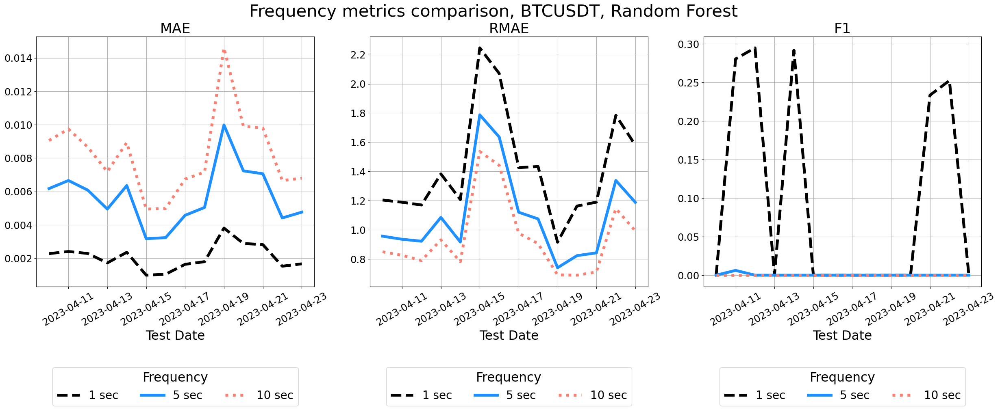

In [405]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_usd_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_forest_usd_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_forest_usd_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_forest_usd_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_forest_usd_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_forest_usd_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_forest_usd_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_forest_usd_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_forest_usd_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCUSDT, Random Forest', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCUSDT, Random Forest.png', bbox_inches = 'tight')
plt.show()

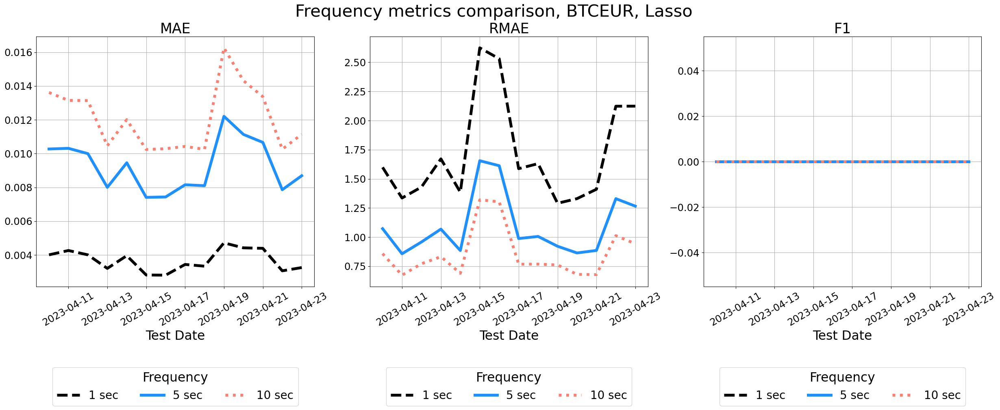

In [406]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_eur_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_lasso_eur_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_lasso_eur_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_lasso_eur_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_lasso_eur_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_lasso_eur_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_lasso_eur_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_lasso_eur_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_lasso_eur_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCEUR, Lasso', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCEUR, Lasso.png', bbox_inches = 'tight')
plt.show()

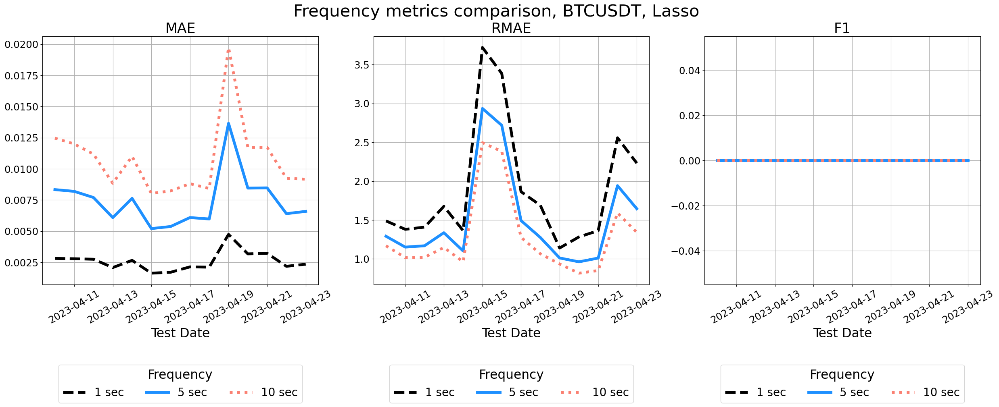

In [407]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_usd_1, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_lasso_usd_5, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_lasso_usd_10, x = 'date', y = 'mae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_lasso_usd_1, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_lasso_usd_5, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_lasso_usd_10, x = 'date', y = 'rmae', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])

sns.lineplot(data = sw_lasso_usd_1, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '1 sec', ax = ax[2])
sns.lineplot(data = sw_lasso_usd_5, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = '5 sec', ax = ax[2])
sns.lineplot(data = sw_lasso_usd_10, x = 'date', y = 'f1', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[2])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Frequency metrics comparison, BTCUSDT, Lasso', fontsize = 30)
plt.savefig(f'Frequency metrics comparison, BTCUSDT, Lasso.png', bbox_inches = 'tight')
plt.show()

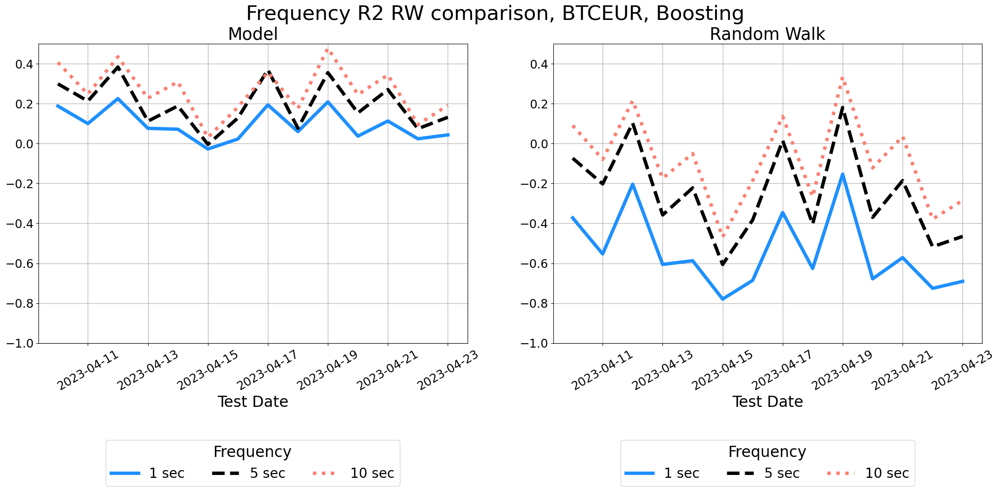

In [399]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'r2', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'r2', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'r2_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'r2_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.set_ylim((-1, 0.5))

ax[0].set_title('Model', fontsize = 25)
ax[1].set_title('Random Walk', fontsize = 25)

plt.suptitle(f'Frequency R2 RW comparison, BTCEUR, Boosting', fontsize = 30)
plt.savefig(f'Frequency R2 RW comparison, BTCEUR, Boosting.png', bbox_inches = 'tight')
plt.show()

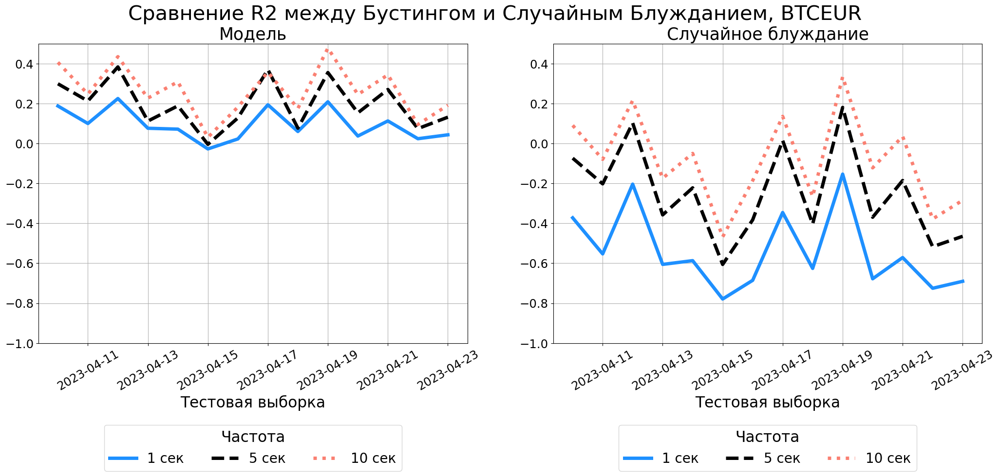

In [14]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'r2', color = 'dodgerblue', 
             linewidth = 5, label = '1 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 сек', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'r2', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[0])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = '1 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'r2_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 сек', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'r2_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 сек', ax = ax[1])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Частота', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.set_ylim((-1, 0.5))

ax[0].set_title('Модель', fontsize = 25)
ax[1].set_title('Случайное блуждание', fontsize = 25)

plt.suptitle(f'Сравнение R2 между Бустингом и Случайным Блужданием, BTCEUR', fontsize = 30)
plt.savefig(f'For Presentation Frequency R2 RW comparison, BTCEUR, Boosting.png', bbox_inches = 'tight')
plt.show()

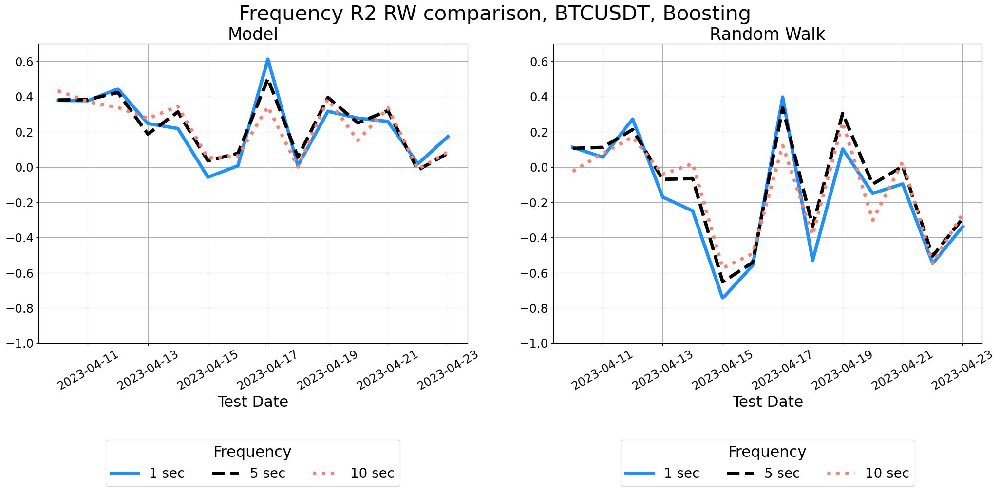

In [410]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'r2', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'r2', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'r2', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'r2_rw', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'r2_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'r2_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.set_ylim((-1, 0.7))

ax[0].set_title('Model', fontsize = 25)
ax[1].set_title('Random Walk', fontsize = 25)

plt.suptitle(f'Frequency R2 RW comparison, BTCUSDT, Boosting', fontsize = 30)
plt.savefig(f'Frequency R2 RW comparison, BTCUSDT, Boosting.png', bbox_inches = 'tight')
plt.show()

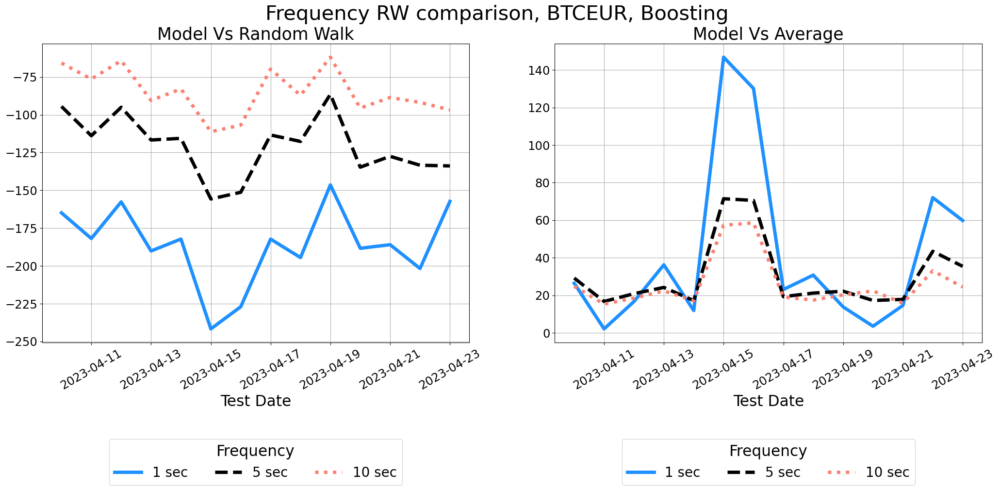

In [414]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'tstat_rw', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'tstat_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'tstat_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_eur_1, x = 'date', y = 'tstat_avg', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_5, x = 'date', y = 'tstat_avg', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_10, x = 'date', y = 'tstat_avg', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    #i.set_ylim((-1, 0.5))

ax[0].set_title('Model Vs Random Walk', fontsize = 25)
ax[1].set_title('Model Vs Average', fontsize = 25)

plt.suptitle(f'Frequency RW comparison, BTCEUR, Boosting', fontsize = 30)
plt.savefig(f'Frequency RW comparison, BTCEUR, Boosting.png', bbox_inches = 'tight')
plt.show()

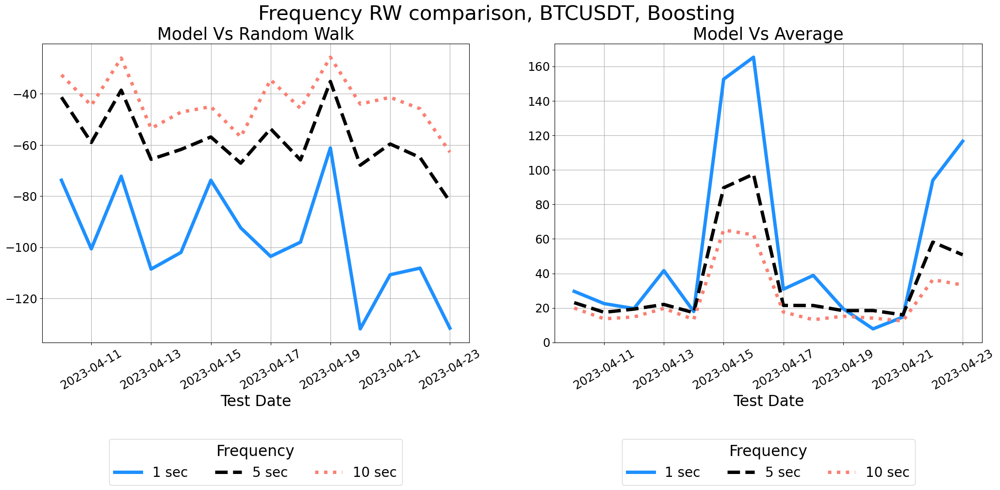

In [413]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'tstat_rw', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'tstat_rw', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'tstat_rw', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[0])

sns.lineplot(data = sw_boosting_usd_1, x = 'date', y = 'tstat_avg', color = 'dodgerblue', 
             linewidth = 5, label = '1 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_5, x = 'date', y = 'tstat_avg', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = '5 sec', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_10, x = 'date', y = 'tstat_avg', color = 'salmon', linestyle = 'dotted', 
             linewidth = 5, label = '10 sec', ax = ax[1])


for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Frequency', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    #i.set_ylim((-1, 0.5))

ax[0].set_title('Model Vs Random Walk', fontsize = 25)
ax[1].set_title('Model Vs Average', fontsize = 25)

plt.suptitle(f'Frequency RW comparison, BTCUSDT, Boosting', fontsize = 30)
plt.savefig(f'Frequency RW comparison, BTCUSDT, Boosting.png', bbox_inches = 'tight')
plt.show()

In [395]:
sw_boosting_eur_1

,date,mae,rmae,recall,precision,f1,r2,r2_rw,tstat_rw,tstat_avg,avg_zero_test,avg_zero_pred
0,2023-04-10,0.003737,1.490554,0.618261,0.805903,0.699721,0.187563,-0.372438,-164.883389,26.386271,0.745222,0.571709
1,2023-04-11,0.004246,1.329980,0.824487,0.673362,0.741301,0.099839,-0.553218,-181.864197,2.080669,0.646253,0.791294
2,2023-04-12,0.003827,1.365397,0.749599,0.741328,0.745440,0.224966,-0.203851,-157.612421,16.640368,0.693419,0.701156
3,2023-04-13,0.003013,1.571000,0.623029,0.775928,0.691123,0.076096,-0.605785,-190.105705,36.219877,0.719014,0.577330
4,2023-04-14,0.003855,1.350115,0.841849,0.711824,0.771396,0.071638,-0.586992,-182.222010,11.839330,0.683599,0.808468
5,2023-04-15,0.002383,2.221432,0.778893,0.827468,0.802446,-0.027485,-0.779225,-241.676045,146.842330,0.806129,0.758807
6,2023-04-16,0.002374,2.143062,0.658100,0.832914,0.735259,0.022569,-0.685571,-227.039525,130.171172,0.803843,0.635131
7,2023-04-17,0.003217,1.485186,0.810508,0.737541,0.772305,0.193677,-0.345837,-182.271787,23.063590,0.700477,0.769777
8,2023-04-18,0.003160,1.544001,0.643145,0.772470,0.701900,0.059750,-0.625852,-194.488437,30.742094,0.721080,0.600359
9,2023-04-19,0.004470,1.222889,0.564227,0.763695,0.648980,0.208568,-0.153592,-146.410985,13.785104,0.684700,0.505864


In [17]:
freq = 1
pair = 'BTCEUR'

sw_lasso_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_eur = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_eur = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')

pair = 'BTCUSDT'

sw_lasso_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_usd = pd.read_excel(f'SW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_usd = pd.read_excel(f'EW_{pair}_RESULTS_FREQ{freq}_RF.xlsx')

In [18]:
sw_lasso_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_eur_both = pd.read_excel(f'SW_BOTH_TICKERS_EUR_RESULTS_FREQ{freq}_RF.xlsx')

sw_lasso_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_LASSO.xlsx')
ew_lasso_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_LASSO.xlsx')

sw_boosting_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_BOOSTING.xlsx')
ew_boosting_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_BOOSTING.xlsx')

sw_forest_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_RF.xlsx')
ew_forest_usd_both = pd.read_excel(f'SW_BOTH_TICKERS_USD_RESULTS_FREQ{freq}_RF.xlsx')

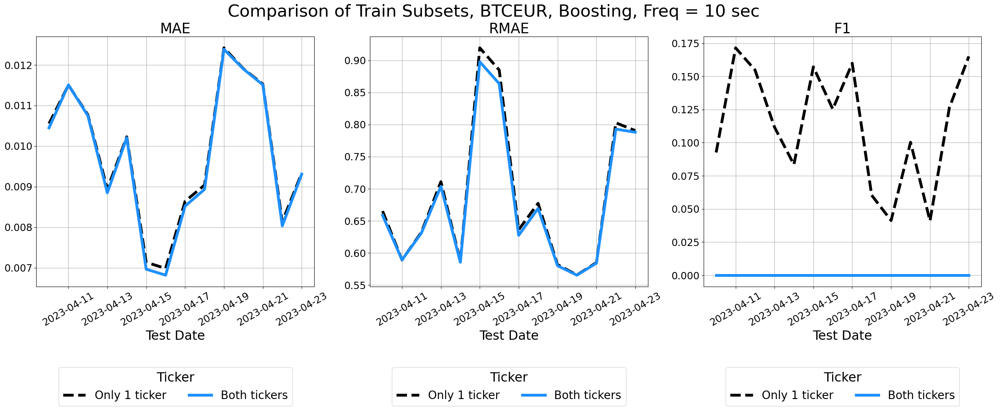

In [434]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCEUR, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCEUR, Boosting, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

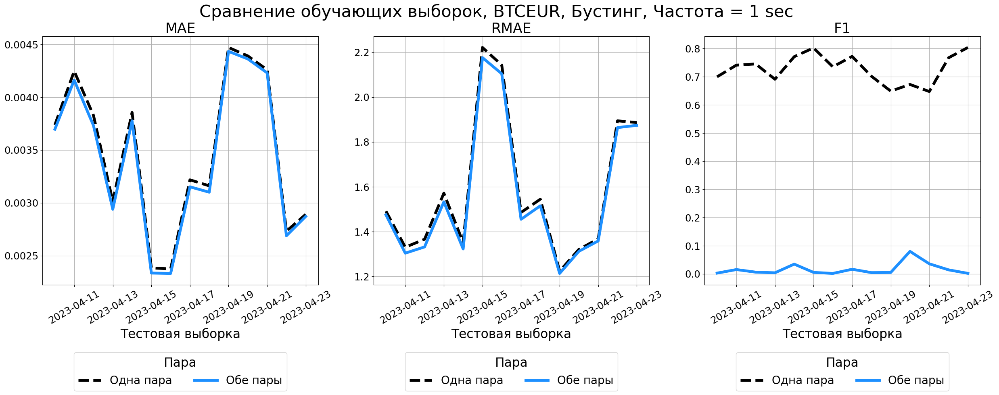

In [22]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[0])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[1])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[2])
sns.lineplot(data = sw_boosting_eur_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Пара', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение обучающих выборок, BTCEUR, Бустинг, Частота = {freq} sec', fontsize = 30)
plt.savefig(f'For Presentation Comparison of Train Subsets, BTCEUR, Boosting, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

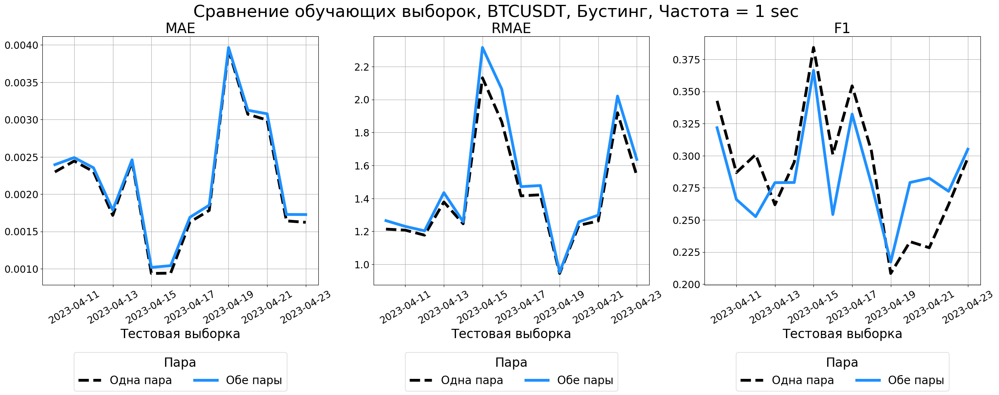

In [21]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[1])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Одна пара', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Обе пары', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Пара', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.45), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение обучающих выборок, BTCUSDT, Бустинг, Частота = {freq} sec', fontsize = 30)
plt.savefig(f'For Presentation Comparison of Train Subsets, BTCUSDT, Boosting, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

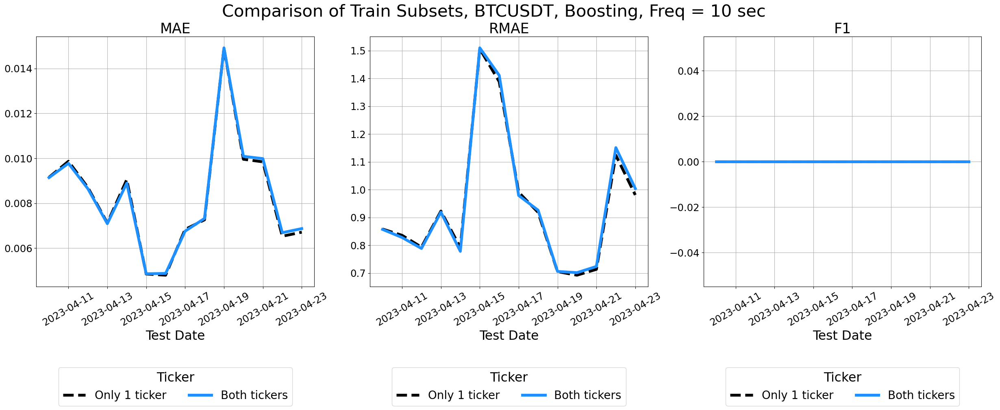

In [435]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_boosting_usd_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCUSDT, Boosting, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCUSDT, Boosting, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

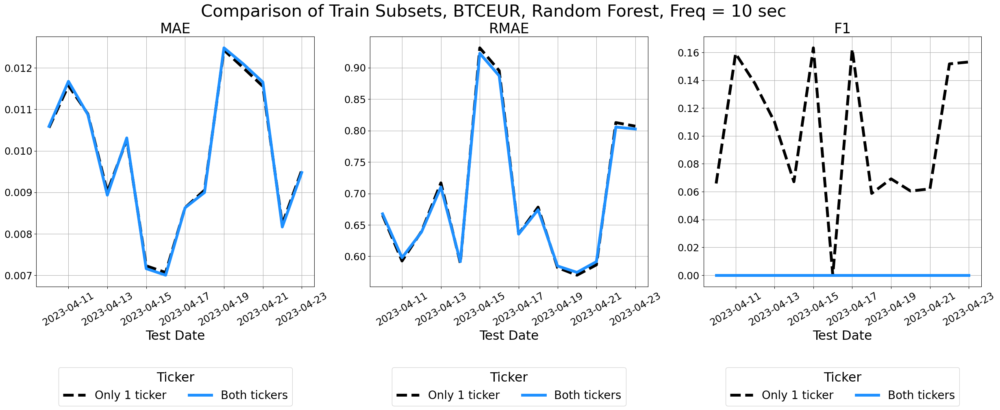

In [436]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_forest_eur_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_forest_eur_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_forest_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_forest_eur_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCEUR, Random Forest, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCEUR, Random Forest, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

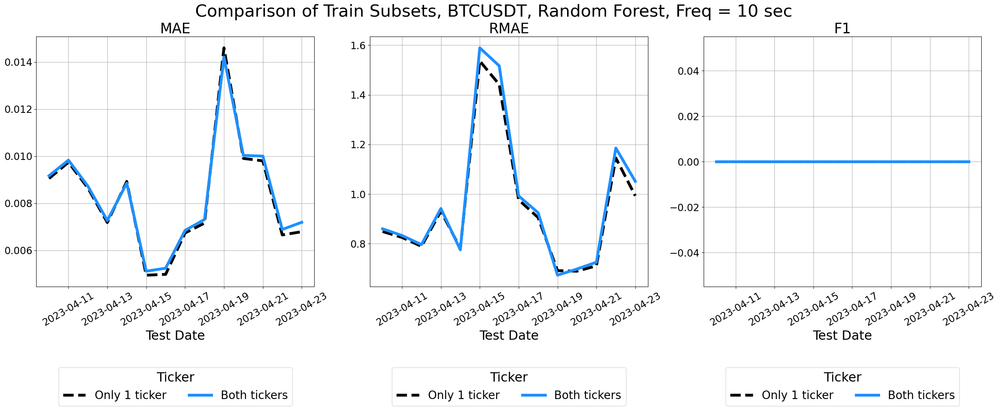

In [437]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_forest_usd_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_forest_usd_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_forest_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_forest_usd_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCUSDT, Random Forest, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCUSDT, Random Forest, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

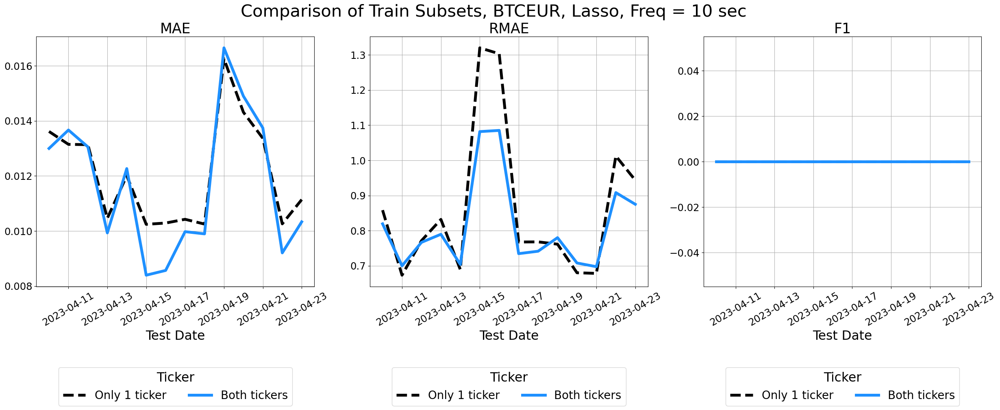

In [438]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_lasso_eur_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_lasso_eur_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_lasso_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_lasso_eur_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCEUR, Lasso, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCEUR, Lasso, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

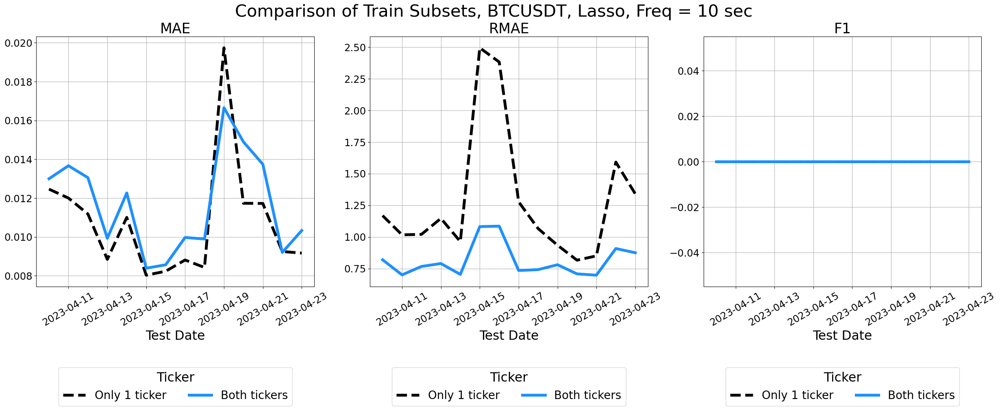

In [439]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[0])
sns.lineplot(data = sw_lasso_eur_both, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[0])

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[1])
sns.lineplot(data = sw_lasso_eur_both, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[1])

sns.lineplot(data = sw_lasso_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Only 1 ticker', ax = ax[2])
sns.lineplot(data = sw_lasso_usd_both, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Both tickers', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Ticker', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.5), 
             ncol = 2, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Comparison of Train Subsets, BTCUSDT, Lasso, Freq = {freq} sec', fontsize = 30)
plt.savefig(f'Comparison of Train Subsets, BTCUSDT, Lasso, Freq = {freq} sec.png', bbox_inches = 'tight')
plt.show()

In [23]:
freq = 1

pair = 'BTCEUR'
eur_fi_sw_1 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
eur_fi_ew_1 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

pair = 'BTCUSDT'
usd_fi_sw_1 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
usd_fi_ew_1 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

In [24]:
freq = 5

pair = 'BTCEUR'
eur_fi_sw_5 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
eur_fi_ew_5 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

pair = 'BTCUSDT'
usd_fi_sw_5 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
usd_fi_ew_5 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

In [25]:
freq = 10

pair = 'BTCEUR'
eur_fi_sw_10 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
eur_fi_ew_10 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

pair = 'BTCUSDT'
usd_fi_sw_10 = pd.read_excel(f'SW_FI_{pair}_freq{freq}.xlsx')
usd_fi_ew_10 = pd.read_excel(f'EW_FI_{pair}_freq{freq}.xlsx')

In [26]:
def fi_intersections(fi_df, ntop = 50):
    
    top50 = fi_df.groupby(['date'])['feature'].head(ntop)
    top50.index = fi_df.groupby(['date'])['date'].head(ntop)
    top50 = top50.groupby(top50.index).apply(set)

    top50 = top50.reset_index(name = 'set_1')
    top50['set_2'] = top50['set_1'].shift()
    top50.dropna(inplace = True)
    top50['intersection'] = top50.apply(lambda x: x['set_1'].intersection(x['set_2']),
                                        axis = 1).apply(len) / ntop * 100

    top50_tot = set(fi_df['feature'].unique())

    for i in range(top50.shape[0]):
        top50_tot = top50_tot.intersection(top50['set_1'].iloc[i])

    return top50, top50_tot, len(top50_tot) / ntop * 100

In [27]:
eur_fi_sw_1_t = fi_intersections(eur_fi_sw_1)
eur_fi_ew_1_t = fi_intersections(eur_fi_ew_1)

usd_fi_sw_1_t = fi_intersections(usd_fi_sw_1)
usd_fi_ew_1_t = fi_intersections(usd_fi_ew_1)
###########################################
eur_fi_sw_5_t = fi_intersections(eur_fi_sw_5)
eur_fi_ew_5_t = fi_intersections(eur_fi_ew_5)

usd_fi_sw_5_t = fi_intersections(usd_fi_sw_5)
usd_fi_ew_5_t = fi_intersections(usd_fi_ew_5)
###########################################
eur_fi_sw_10_t = fi_intersections(eur_fi_sw_10)
eur_fi_ew_10_t = fi_intersections(eur_fi_ew_10)

usd_fi_sw_10_t = fi_intersections(usd_fi_sw_10)
usd_fi_ew_10_t = fi_intersections(usd_fi_ew_10)

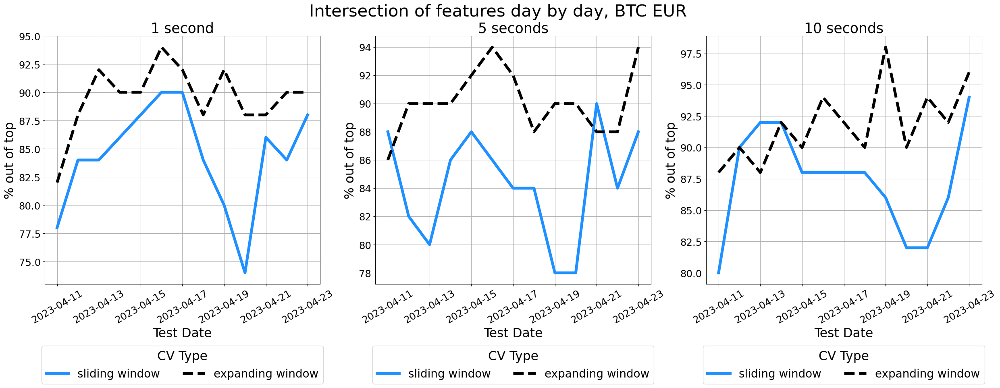

In [649]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = eur_fi_sw_1_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[0])
sns.lineplot(data = eur_fi_ew_1_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[0])

sns.lineplot(data = eur_fi_sw_5_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[1])
sns.lineplot(data = eur_fi_ew_5_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[1])

sns.lineplot(data = eur_fi_sw_10_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[2])
sns.lineplot(data = eur_fi_ew_10_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[2])

for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
             bbox_to_anchor = (0.5, -0.425))
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('% out of top', fontsize = 22.5)

ax[0].set_title('1 second', fontsize = 25)
ax[1].set_title('5 seconds', fontsize = 25)
ax[2].set_title('10 seconds', fontsize = 25)

plt.suptitle('Intersection of features day by day, BTC EUR', fontsize = 30)
plt.savefig('Intersection of features day by day, BTC EUR.png', bbox_inches = 'tight')
plt.show()

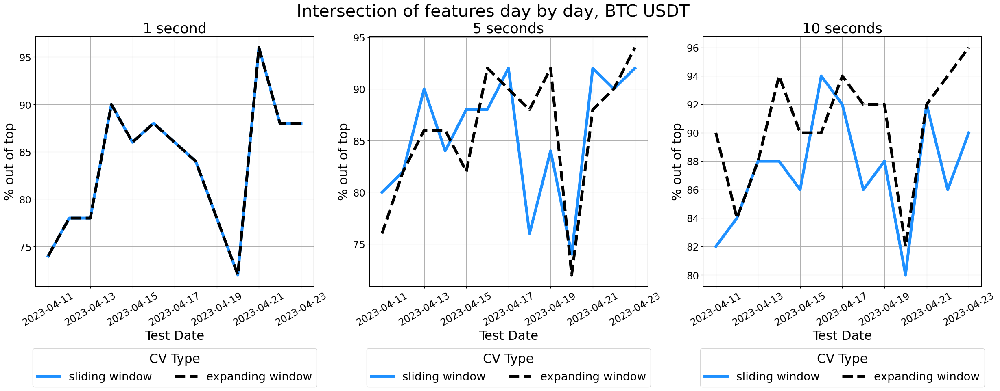

In [650]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = usd_fi_sw_1_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[0])
sns.lineplot(data = usd_fi_sw_1_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[0])

sns.lineplot(data = usd_fi_sw_5_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[1])
sns.lineplot(data = usd_fi_ew_5_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[1])

sns.lineplot(data = usd_fi_sw_10_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[2])
sns.lineplot(data = usd_fi_ew_10_t[0], x = 'date', y = 'intersection', linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[2])

for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
             bbox_to_anchor = (0.5, -0.425))
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('% out of top', fontsize = 22.5)

ax[0].set_title('1 second', fontsize = 25)
ax[1].set_title('5 seconds', fontsize = 25)
ax[2].set_title('10 seconds', fontsize = 25)

plt.suptitle('Intersection of features day by day, BTC USDT', fontsize = 30)
plt.savefig('Intersection of features day by day, BTC USDT.png', bbox_inches = 'tight')
plt.show()

In [28]:
eur_fi_sw_total = [eur_fi_sw_1_t[2], eur_fi_sw_5_t[2], eur_fi_sw_10_t[2]]
eur_fi_ew_total = [eur_fi_ew_1_t[2], eur_fi_ew_5_t[2], eur_fi_ew_10_t[2]]

usd_fi_sw_total = [usd_fi_sw_1_t[2], usd_fi_sw_5_t[2], usd_fi_sw_10_t[2]]
usd_fi_ew_total = [usd_fi_ew_1_t[2], usd_fi_ew_5_t[2], usd_fi_ew_10_t[2]]

frequences = ['1 sec', '5 sec', '10 sec']

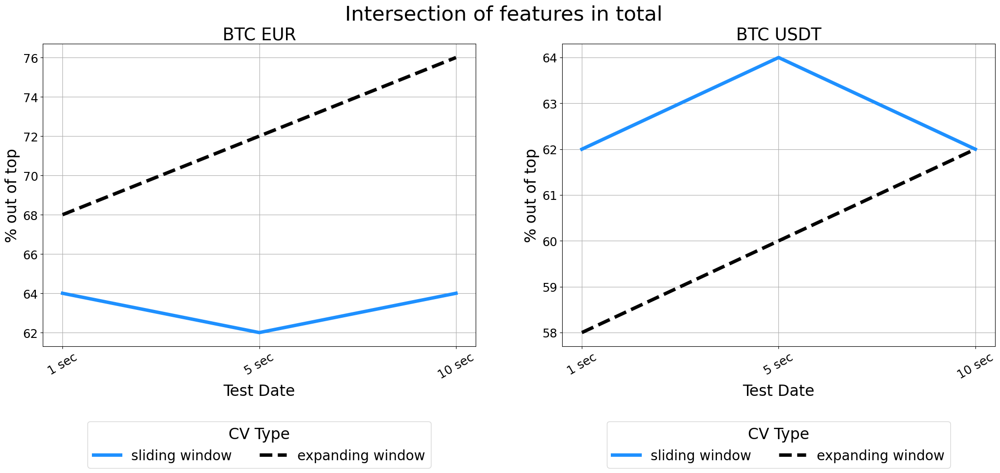

In [652]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(x = frequences, y = eur_fi_sw_total, linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[0])
sns.lineplot(x = frequences, y = eur_fi_ew_total, linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[0])

sns.lineplot(x = frequences, y = usd_fi_sw_total, linewidth = 5, color = 'dodgerblue', 
             label = 'sliding window', ax = ax[1])
sns.lineplot(x = frequences, y = usd_fi_ew_total, linewidth = 5, color = 'black', 
             label = 'expanding window', linestyle = 'dashed', ax = ax[1])

for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.legend(fontsize = 20, title = 'CV Type', title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
             bbox_to_anchor = (0.5, -0.425))
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('% out of top', fontsize = 22.5)

ax[0].set_title('BTC EUR', fontsize = 25)
ax[1].set_title('BTC USDT', fontsize = 25)

plt.suptitle('Intersection of features in total', fontsize = 30)
plt.savefig('Intersection of features in total.png', bbox_inches = 'tight')
plt.show()

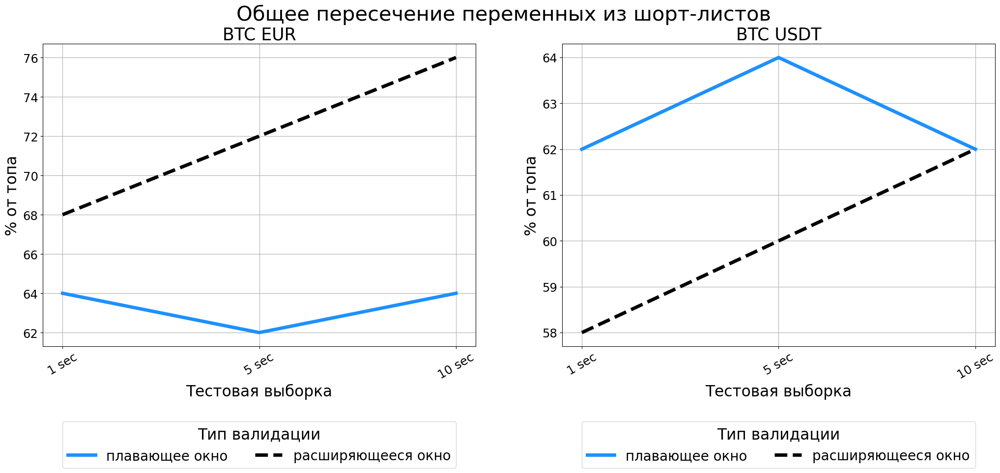

In [29]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(x = frequences, y = eur_fi_sw_total, linewidth = 5, color = 'dodgerblue', 
             label = 'плавающее окно', ax = ax[0])
sns.lineplot(x = frequences, y = eur_fi_ew_total, linewidth = 5, color = 'black', 
             label = 'расширяющееся окно', linestyle = 'dashed', ax = ax[0])

sns.lineplot(x = frequences, y = usd_fi_sw_total, linewidth = 5, color = 'dodgerblue', 
             label = 'плавающее окно', ax = ax[1])
sns.lineplot(x = frequences, y = usd_fi_ew_total, linewidth = 5, color = 'black', 
             label = 'расширяющееся окно', linestyle = 'dashed', ax = ax[1])

for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)
    i.legend(fontsize = 20, title = 'Тип валидации', title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
             bbox_to_anchor = (0.5, -0.425))
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('% от топа', fontsize = 22.5)

ax[0].set_title('BTC EUR', fontsize = 25)
ax[1].set_title('BTC USDT', fontsize = 25)

plt.suptitle('Общее пересечение переменных из шорт-листов', fontsize = 30)
plt.savefig('For Presentation Intersection of features in total.png', bbox_inches = 'tight')
plt.show()

In [30]:
ticker_sw_intersections = [
                           len(eur_fi_sw_1_t[1].intersection(usd_fi_sw_1_t[1])) / len(eur_fi_sw_1_t[1].union(usd_fi_sw_1_t[1])),
                           len(eur_fi_sw_5_t[1].intersection(usd_fi_sw_5_t[1])) / len(eur_fi_sw_5_t[1].union(usd_fi_sw_5_t[1])),
                           len(eur_fi_sw_10_t[1].intersection(usd_fi_sw_10_t[1])) / len(eur_fi_sw_10_t[1].union(usd_fi_sw_10_t[1]))
                          ]

ticker_ew_intersections = [
                           len(eur_fi_ew_1_t[1].intersection(usd_fi_ew_1_t[1])) / len(eur_fi_ew_1_t[1].union(usd_fi_ew_1_t[1])),
                           len(eur_fi_ew_5_t[1].intersection(usd_fi_ew_5_t[1])) / len(eur_fi_ew_5_t[1].union(usd_fi_ew_5_t[1])),
                           len(eur_fi_ew_10_t[1].intersection(usd_fi_ew_10_t[1])) / len(eur_fi_ew_10_t[1].union(usd_fi_ew_10_t[1]))
                          ]

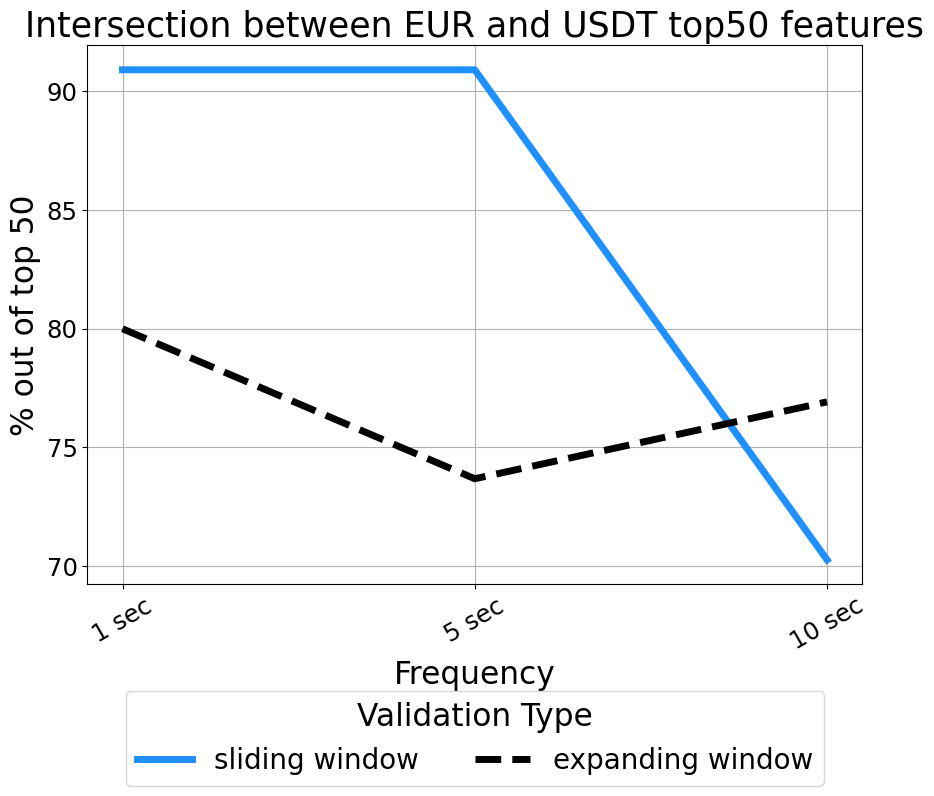

In [680]:
plt.figure(figsize = (10, 7))
sns.lineplot(x = frequences, y = [i * 100 for i in ticker_sw_intersections], color = 'dodgerblue', 
             linewidth = 5, label = 'sliding window')
sns.lineplot(x = frequences,  y = [i * 100 for i in ticker_ew_intersections], color = 'black', 
             linewidth = 5, label = 'expanding window', linestyle = 'dashed')
plt.grid()
plt.title('Intersection between EUR and USDT top50 features', fontsize = 25)
plt.xlabel('Frequency', fontsize = 22.5)
plt.ylabel('% out of top 50', fontsize = 22.5)
plt.legend(title = 'CV Type', fontsize = 20, title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
           bbox_to_anchor = (0.5, -0.4))
plt.xticks(rotation = 30)
plt.tick_params(labelsize = 17.5)
plt.savefig('Between tickers features intersection, top 50.png', bbox_inches = 'tight')
plt.show()

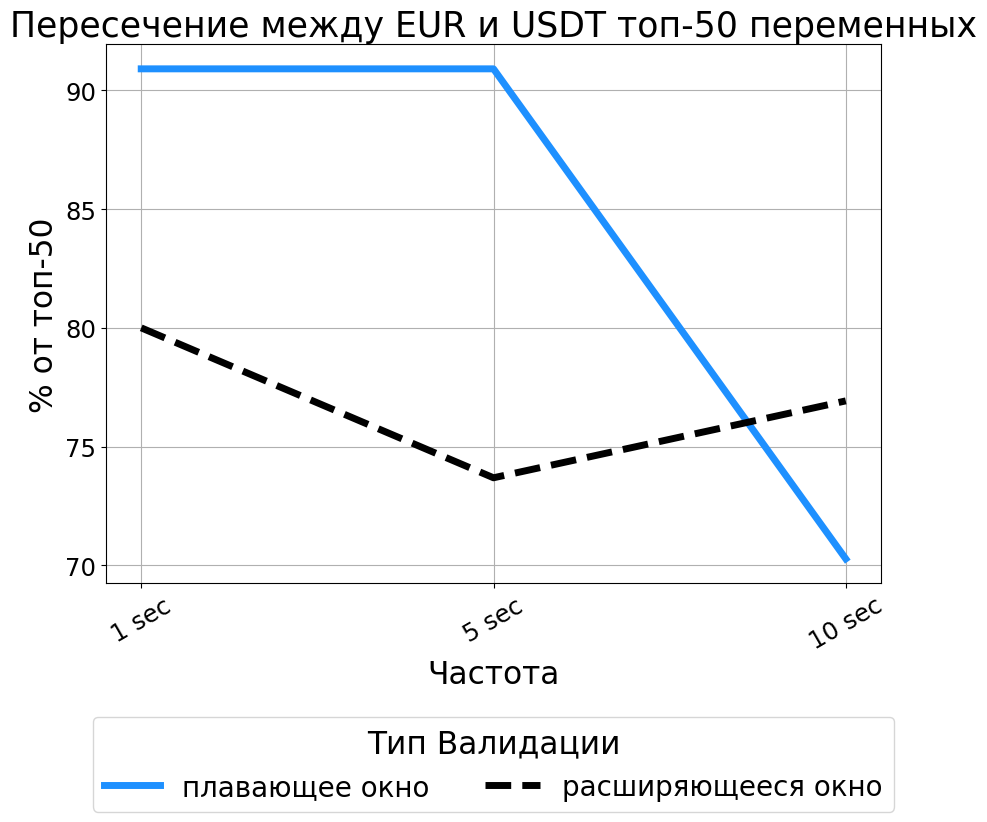

In [32]:
plt.figure(figsize = (10, 7))
sns.lineplot(x = frequences, y = [i * 100 for i in ticker_sw_intersections], color = 'dodgerblue', 
             linewidth = 5, label = 'плавающее окно')
sns.lineplot(x = frequences,  y = [i * 100 for i in ticker_ew_intersections], color = 'black', 
             linewidth = 5, label = 'расширяющееся окно', linestyle = 'dashed')
plt.grid()
plt.title('Пересечение между EUR и USDT топ-50 переменных', fontsize = 25)
plt.xlabel('Частота', fontsize = 22.5)
plt.ylabel('% от топ-50', fontsize = 22.5)
plt.legend(title = 'Тип Валидации', fontsize = 20, title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
           bbox_to_anchor = (0.5, -0.45))
plt.xticks(rotation = 30)
plt.tick_params(labelsize = 17.5)
plt.savefig('For Presentation Between tickers features intersection, top 50.png', bbox_inches = 'tight')
plt.show()

In [33]:
eur_sw_intersections = (len(eur_fi_sw_1_t[1].intersection(eur_fi_sw_5_t[1]).intersection(eur_fi_sw_10_t[1])) / 
                        len(eur_fi_sw_1_t[1].union(eur_fi_sw_5_t[1]).union(eur_fi_sw_10_t[1])) * 100)
eur_ew_intersections = (len(eur_fi_ew_1_t[1].intersection(eur_fi_ew_5_t[1]).intersection(eur_fi_ew_10_t[1])) / 
                        len(eur_fi_ew_1_t[1].union(eur_fi_ew_5_t[1]).union(eur_fi_ew_10_t[1])) * 100)


usd_sw_intersections = (len(usd_fi_sw_1_t[1].intersection(usd_fi_sw_5_t[1]).intersection(usd_fi_sw_10_t[1])) / 
                        len(usd_fi_sw_1_t[1].union(usd_fi_sw_5_t[1]).union(usd_fi_sw_10_t[1])) * 100)
usd_ew_intersections = (len(usd_fi_ew_1_t[1].intersection(usd_fi_ew_5_t[1]).intersection(usd_fi_ew_10_t[1])) / 
                        len(usd_fi_ew_1_t[1].union(usd_fi_ew_5_t[1]).union(usd_fi_ew_10_t[1])) * 100)                    


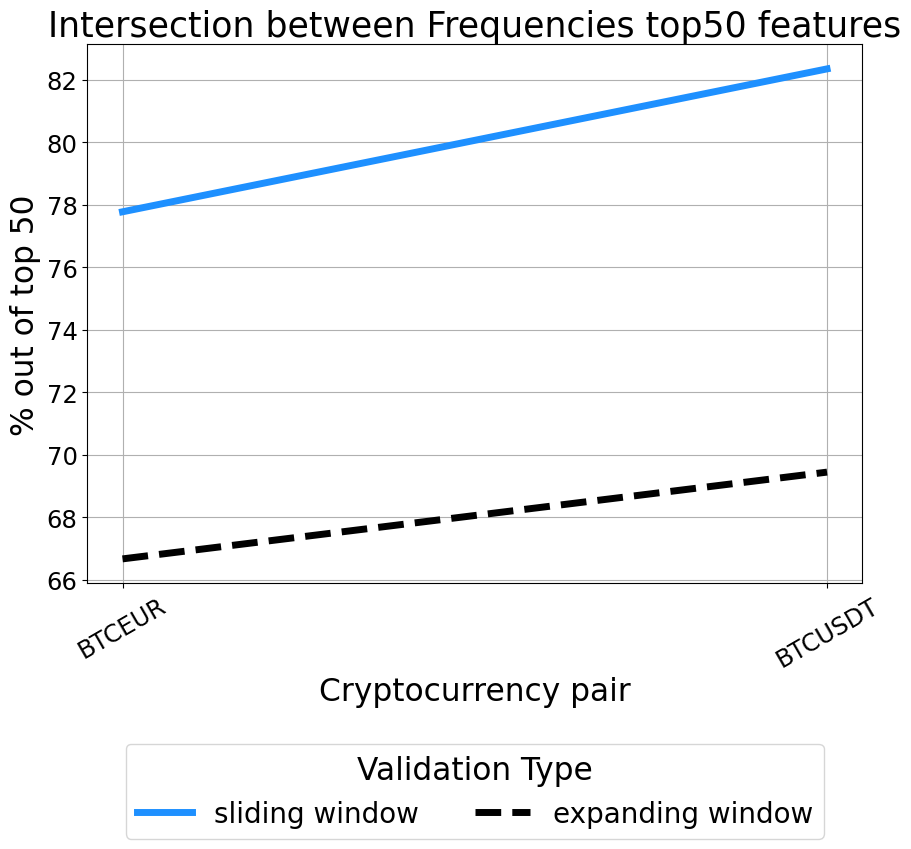

In [14]:
plt.figure(figsize = (10, 7))
sns.lineplot(x = ['BTCEUR', 'BTCUSDT'], y = [eur_sw_intersections, usd_sw_intersections], color = 'dodgerblue', 
             linewidth = 5, label = 'sliding window')
sns.lineplot(x = ['BTCEUR', 'BTCUSDT'],  y = [eur_ew_intersections, usd_ew_intersections], color = 'black', 
             linewidth = 5, label = 'expanding window', linestyle = 'dashed')
plt.grid()
plt.title('Intersection between Frequencies top50 features', fontsize = 25)
plt.xlabel('Cryptocurrency pair', fontsize = 22.5)
plt.ylabel('% out of top 50', fontsize = 22.5)
plt.legend(title = 'Validation Type', fontsize = 20, title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
           bbox_to_anchor = (0.5, -0.5))
plt.xticks(rotation = 30)
plt.tick_params(labelsize = 17.5)
plt.savefig('Intersection between Frequencies, top 50.png', bbox_inches = 'tight')
plt.show()

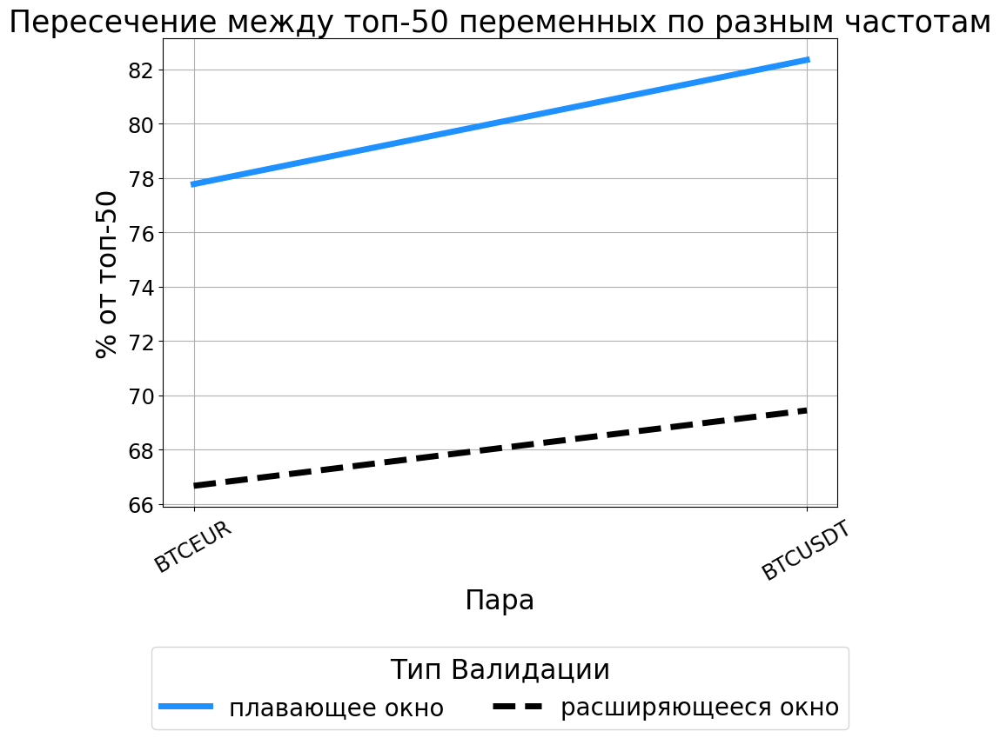

In [34]:
plt.figure(figsize = (10, 7))
sns.lineplot(x = ['BTCEUR', 'BTCUSDT'], y = [eur_sw_intersections, usd_sw_intersections], color = 'dodgerblue', 
             linewidth = 5, label = 'плавающее окно')
sns.lineplot(x = ['BTCEUR', 'BTCUSDT'],  y = [eur_ew_intersections, usd_ew_intersections], color = 'black', 
             linewidth = 5, label = 'расширяющееся окно', linestyle = 'dashed')
plt.grid()
plt.title('Пересечение между топ-50 переменных по разным частотам', fontsize = 25)
plt.xlabel('Пара', fontsize = 22.5)
plt.ylabel('% от топ-50', fontsize = 22.5)
plt.legend(title = 'Тип Валидации', fontsize = 20, title_fontsize = 22.5, ncol = 2, loc = 'lower center', 
           bbox_to_anchor = (0.5, -0.5))
plt.xticks(rotation = 30)
plt.tick_params(labelsize = 17.5)
plt.savefig('For Presentation Intersection between Frequencies, top 50.png', bbox_inches = 'tight')
plt.show()

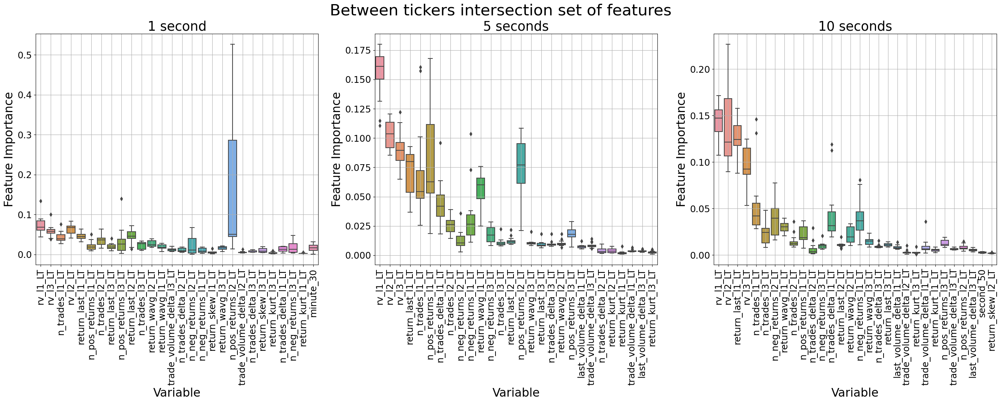

In [668]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (33, 8))

sns.boxplot(data = eur_fi_ew_1[eur_fi_ew_1['feature'].isin(eur_fi_ew_1_t[1].intersection(usd_fi_ew_1_t[1]))],
            x = 'feature', y = 'importance', ax = ax[0])
sns.boxplot(data = eur_fi_ew_5[eur_fi_ew_5['feature'].isin(eur_fi_ew_5_t[1].intersection(usd_fi_ew_5_t[1]))],
            x = 'feature', y = 'importance', ax = ax[1])
sns.boxplot(data = eur_fi_ew_10[eur_fi_ew_10['feature'].isin(eur_fi_ew_10_t[1].intersection(usd_fi_ew_10_t[1]))],
            x = 'feature', y = 'importance', ax = ax[2])


for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 90)
    i.set_xlabel('Variable', fontsize = 22.5)
    i.set_ylabel('Feature Importance', fontsize = 22.5)

ax[0].set_title('1 second', fontsize = 25)
ax[1].set_title('5 seconds', fontsize = 25)
ax[2].set_title('10 seconds', fontsize = 25)

plt.suptitle('Between tickers intersection set of features', fontsize = 30)
plt.savefig('Between tickers intersection set of features.png', bbox_inches = 'tight')
plt.show()

In [670]:
eur_intersections = eur_fi_ew_1_t[1].intersection(eur_fi_ew_5_t[1]).intersection(eur_fi_ew_10_t[1])
usd_intersections = usd_fi_ew_1_t[1].intersection(usd_fi_ew_5_t[1]).intersection(usd_fi_ew_10_t[1])

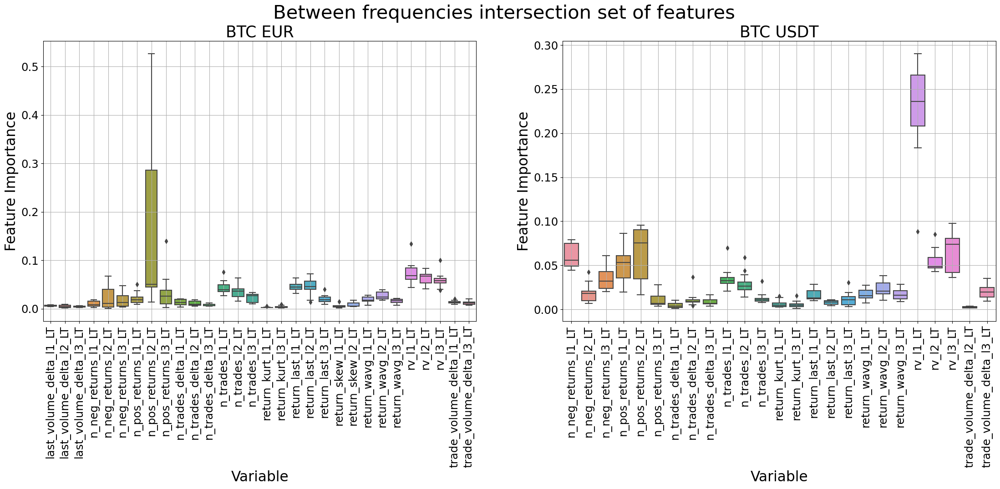

In [673]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (27, 8))

sns.boxplot(data = eur_fi_ew_1[eur_fi_ew_1['feature'].isin(eur_intersections)].sort_values(by = ['feature']),
            x = 'feature', y = 'importance', ax = ax[0])
sns.boxplot(data = usd_fi_ew_1[usd_fi_ew_1['feature'].isin(usd_intersections)].sort_values(by = ['feature']),
            x = 'feature', y = 'importance', ax = ax[1])

for i in ax:
    i.grid()
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 90)
    i.set_xlabel('Variable', fontsize = 22.5)
    i.set_ylabel('Feature Importance', fontsize = 22.5)

ax[0].set_title('BTC EUR', fontsize = 25)
ax[1].set_title('BTC USDT', fontsize = 25)

plt.suptitle('Between frequencies intersection set of features', fontsize = 30)
plt.savefig('Between frequencies intersection set of features.png', bbox_inches = 'tight')
plt.show()

In [35]:
sw_best_boosting_eur = pd.read_excel(f'SW_BTCEUR_RESULTS_FREQ1_BEST_BOOSTING_SELECTION.xlsx')
sw_boosting_eur = pd.read_excel(f'SW_BTCEUR_RESULTS_FREQ1_BOOSTING.xlsx') 

sw_best_boosting_usd = pd.read_excel(f'SW_BTCUSDT_RESULTS_FREQ1_BEST_BOOSTING_SELECTION.xlsx')
sw_boosting_usd = pd.read_excel(f'SW_BTCUSDT_RESULTS_FREQ1_BOOSTING.xlsx') 


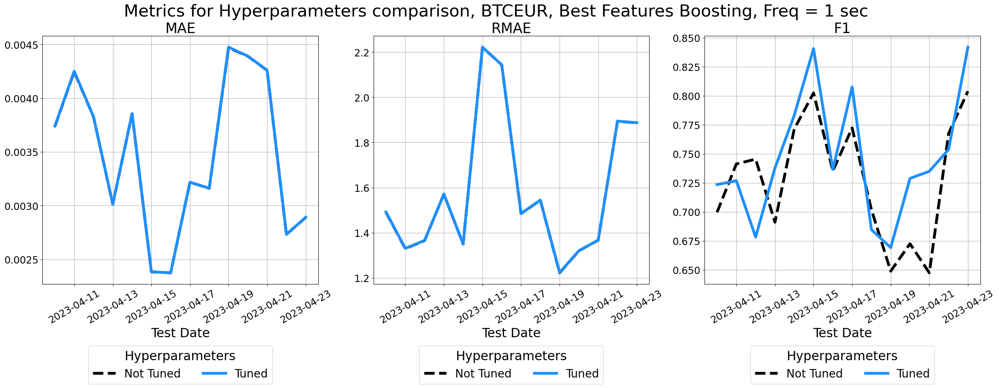

In [19]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[0])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[1])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[2])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Hyperparameters', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.425), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Hyperparameters comparison, BTCEUR, Best Features Boosting, Freq = 1 sec', fontsize = 30)
plt.savefig(f'Metrics for Hyperparameters comparison, BTCEUR, Best Features Boosting, Freq 1 sec.png', bbox_inches = 'tight')
plt.show()

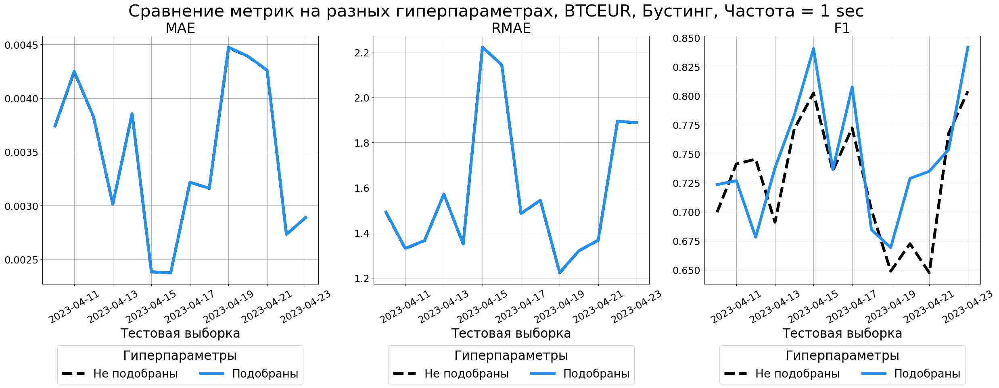

In [37]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Не подобраны', ax = ax[0])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Подобраны', ax = ax[0])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Не подобраны', ax = ax[1])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Подобраны', ax = ax[1])

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Не подобраны', ax = ax[2])
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Подобраны', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Гиперпараметры', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.425), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Тестовая выборка', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Сравнение метрик на разных гиперпараметрах, BTCEUR, Бустинг, Частота = 1 sec', fontsize = 30)
plt.savefig(f'For Presentation Metrics for Hyperparameters comparison, BTCEUR, Best Features Boosting, Freq 1 sec.png', bbox_inches = 'tight')
plt.show()

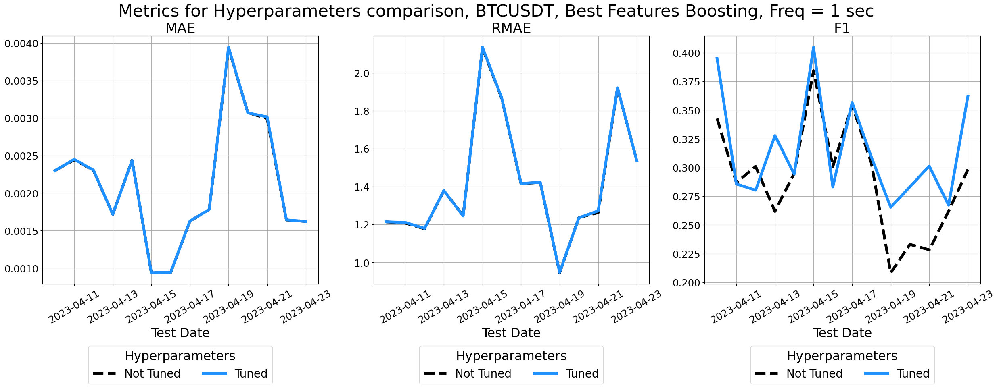

In [28]:
fig, ax = plt.subplots(ncols = 3, nrows = 1, figsize = (30, 8))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'mae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[0])
sns.lineplot(data = sw_best_boosting_usd, x = 'date', y = 'mae', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[0])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'rmae', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[1])
sns.lineplot(data = sw_best_boosting_usd, x = 'date', y = 'rmae', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[1])

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'f1', color = 'black', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned', ax = ax[2])
sns.lineplot(data = sw_best_boosting_usd, x = 'date', y = 'f1', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned', ax = ax[2])

for i in ax:
    i.grid()
    i.legend(fontsize = 20, title = 'Hyperparameters', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.425), 
             ncol = 3, loc = 'lower center')
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('MAE', fontsize = 25)
ax[1].set_title('RMAE', fontsize = 25)
ax[2].set_title('F1', fontsize = 25)

plt.suptitle(f'Metrics for Hyperparameters comparison, BTCUSDT, Best Features Boosting, Freq = 1 sec', fontsize = 30)
plt.savefig(f'Metrics for Hyperparameters comparison, BTCUSDT, Best Features Boosting, Freq 1 sec.png', bbox_inches = 'tight')
plt.show()

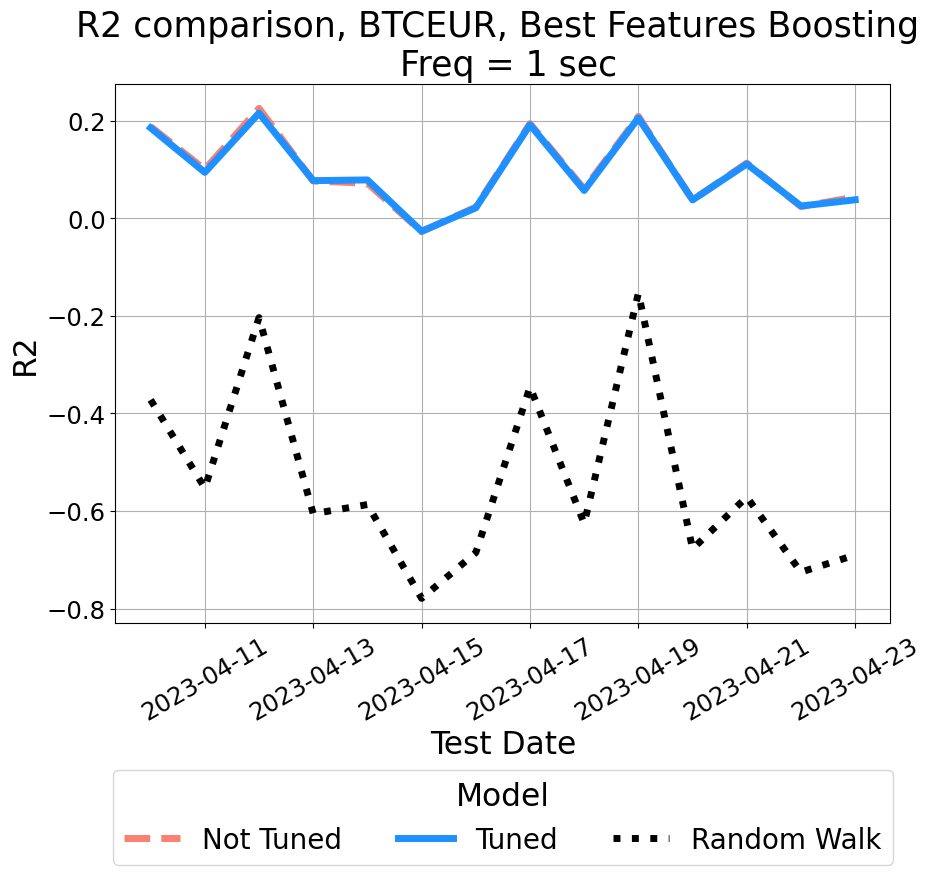

In [25]:
plt.figure(figsize = (10, 7))

sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'r2', color = 'salmon', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned')
sns.lineplot(data = sw_best_boosting_eur, x = 'date', y = 'r2', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned')
sns.lineplot(data = sw_boosting_eur, x = 'date', y = 'r2_rw', color = 'black', linestyle = 'dotted', 
             linewidth = 5, label = 'Random Walk')

plt.grid()
plt.legend(fontsize = 20, title = 'Model', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.475), 
           ncol = 3, loc = 'lower center')
plt.xlabel('Test Date', fontsize = 22.5)
plt.ylabel('R2', fontsize = 22.5)
plt.tick_params(labelsize = 17.5)
plt.xticks(rotation = 30)

plt.title(f'R2 comparison, BTCEUR, Best Features Boosting \n Freq = 1 sec', fontsize = 25)
plt.savefig(f'R2 comparison, BTCEUR, Best Features Boosting, Freq = 1 sec.png', bbox_inches = 'tight')
plt.show()

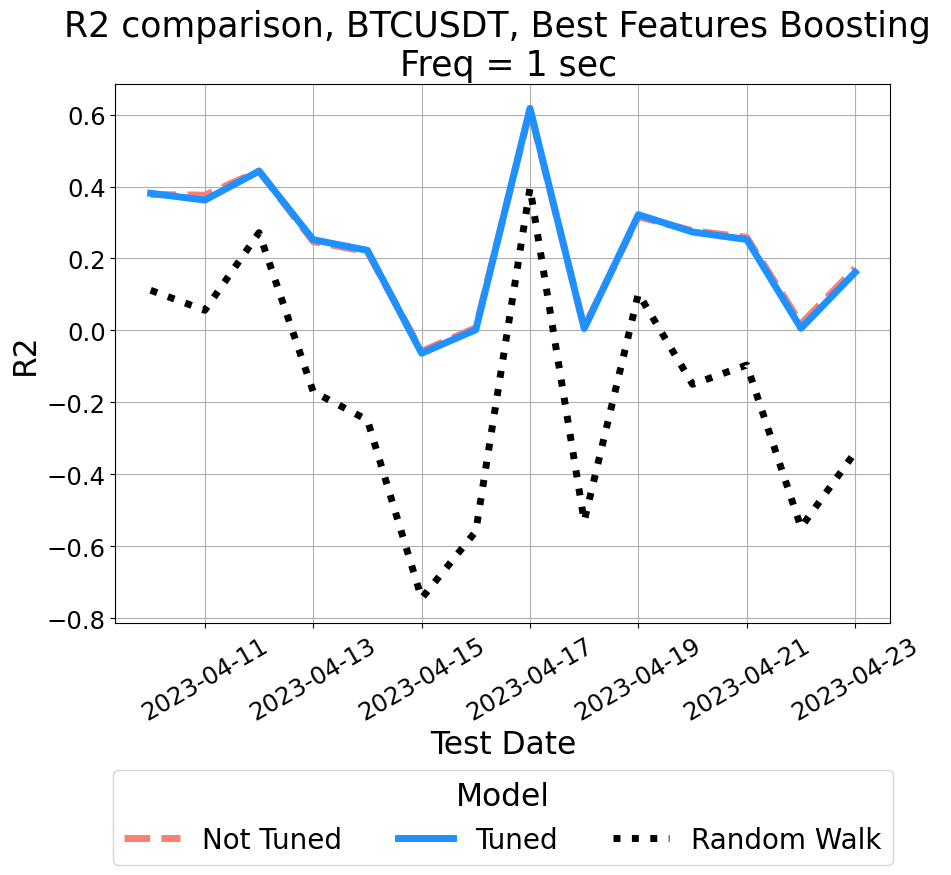

In [29]:
plt.figure(figsize = (10, 7))

sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'r2', color = 'salmon', linestyle = 'dashed', 
             linewidth = 5, label = 'Not Tuned')
sns.lineplot(data = sw_best_boosting_usd, x = 'date', y = 'r2', color = 'dodgerblue', 
             linewidth = 5, label = 'Tuned')
sns.lineplot(data = sw_boosting_usd, x = 'date', y = 'r2_rw', color = 'black', linestyle = 'dotted', 
             linewidth = 5, label = 'Random Walk')

plt.grid()
plt.legend(fontsize = 20, title = 'Model', title_fontsize = 22.5, bbox_to_anchor = (0.5, -0.475), 
           ncol = 3, loc = 'lower center')
plt.xlabel('Test Date', fontsize = 22.5)
plt.ylabel('R2', fontsize = 22.5)
plt.tick_params(labelsize = 17.5)
plt.xticks(rotation = 30)

plt.title(f'R2 comparison, BTCUSDT, Best Features Boosting \n Freq = 1 sec', fontsize = 25)
plt.savefig(f'R2 comparison, BTCUSDT, Best Features Boosting, Freq = 1 sec.png', bbox_inches = 'tight')
plt.show()

In [28]:
best_params = pd.read_excel(f'SW_BTCEUR_PARAMS_FREQ1_BEST_BOOSTING.xlsx')

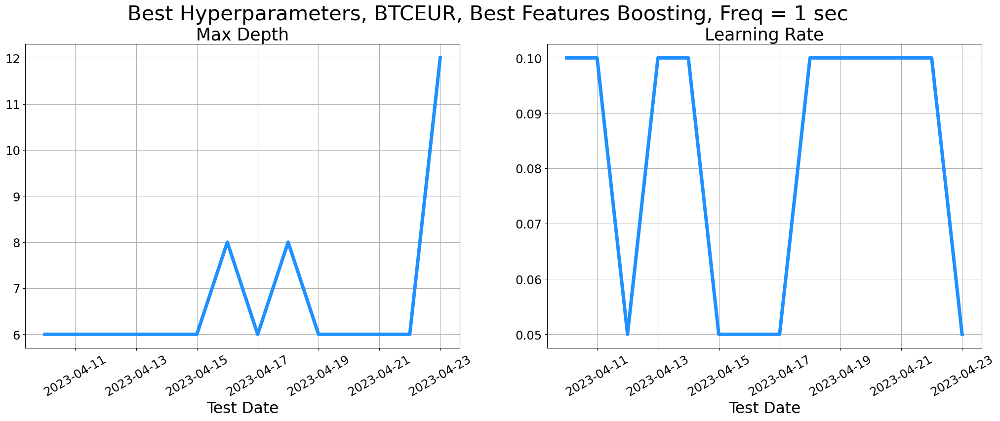

In [31]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (25, 8))

sns.lineplot(data = best_params, x = 'date', y = 'max_depth', color = 'dodgerblue', 
             linewidth = 5, ax = ax[0])
sns.lineplot(data = best_params, x = 'date', y = 'learning_rate', color = 'dodgerblue', 
             linewidth = 5, ax = ax[1])

for i in ax:
    i.grid()
    i.set_xlabel('Test Date', fontsize = 22.5)
    i.set_ylabel('')
    i.tick_params(labelsize = 17.5)
    i.xaxis.set_tick_params(rotation = 30)

ax[0].set_title('Max Depth', fontsize = 25)
ax[1].set_title('Learning Rate', fontsize = 25)

plt.suptitle(f'Best Hyperparameters, BTCEUR, Best Features Boosting, Freq = 1 sec', fontsize = 30)
plt.savefig(f'Best Hyperparameters, BTCEUR, Best Features Boosting, Freq = 1 sec.png', bbox_inches = 'tight')
plt.show()

In [34]:
sw_best_boosting_usd['pair'] = 'BTCUSDT'
sw_best_boosting_eur['pair'] = 'BTCEUR'

best_boosting = sw_best_boosting_usd.append(sw_best_boosting_eur, ignore_index = True)

best_boosting.groupby(['pair'])[['mae', 'rmae', 'f1', 'r2', 'r2_rw']].mean().reset_index().to_excel('best_boosting_results.xlsx', index = None)



In [35]:
best_boosting

,date,mae,rmae,recall,precision,f1,r2,r2_rw,tstat_rw,tstat_avg,avg_zero_test,avg_zero_pred,pair
0,2023-04-10,0.002298,1.213769,0.519960,0.318342,0.394906,0.381214,0.111641,-73.989717,28.203151,0.214944,0.351076,BTCUSDT
1,2023-04-11,0.002450,1.210544,0.539259,0.194302,0.285673,0.362321,0.056016,-99.661690,22.666869,0.132269,0.367093,BTCUSDT
2,2023-04-12,0.002306,1.179035,0.292065,0.269366,0.280256,0.442825,0.271836,-72.266851,19.409228,0.171081,0.185499,BTCUSDT
3,2023-04-13,0.001717,1.378559,0.341984,0.314681,0.327765,0.252227,-0.170178,-108.976382,40.845152,0.204032,0.221734,BTCUSDT
4,2023-04-14,0.002435,1.245163,0.558007,0.199746,0.294184,0.222676,-0.249067,-102.198289,18.279860,0.128731,0.359620,BTCUSDT
5,2023-04-15,0.000940,2.135475,0.701296,0.284443,0.404730,-0.063438,-0.744853,-73.715337,149.267053,0.245234,0.604626,BTCUSDT
6,2023-04-16,0.000943,1.867224,0.240048,0.344891,0.283073,0.002013,-0.558454,-92.231790,163.090161,0.263298,0.183258,BTCUSDT
7,2023-04-17,0.001628,1.416635,0.624427,0.249555,0.356595,0.617348,0.396387,-104.465930,29.861004,0.183763,0.459806,BTCUSDT
8,2023-04-18,0.001783,1.422156,0.305758,0.312275,0.308982,0.005382,-0.530359,-97.826915,38.714815,0.191444,0.187448,BTCUSDT
9,2023-04-19,0.003943,0.947105,0.227156,0.318948,0.265338,0.321887,0.102240,-61.546583,19.762410,0.159358,0.113495,BTCUSDT


In [690]:
top_features_sw_1 = pd.DataFrame({'feature': list(eur_fi_sw_1_t[1].intersection(usd_fi_sw_1_t[1]))})
top_features_sw_1.to_excel('top_features_sw_1.xlsx', index = None)

top_features_sw_5 = pd.DataFrame({'feature': list(eur_fi_sw_5_t[1].intersection(usd_fi_sw_5_t[1]))})
top_features_sw_5.to_excel('top_features_sw_5.xlsx', index = None)

top_features_sw_10 = pd.DataFrame({'feature': list(eur_fi_sw_10_t[1].intersection(usd_fi_sw_10_t[1]))})
top_features_sw_10.to_excel('top_features_sw_10.xlsx', index = None)


In [24]:
overall_table = pd.DataFrame()

for p in ['BTCUSDT', 'BTCEUR']:
    for f in ['1', '5', '10']:
        for a in ['LASSO', 'BOOSTING', 'RF']:
            for v in ['SW', 'EW']:
                tmp_df_1 = pd.read_excel(f'ANYA_{v}_{p}_RESULTS_FREQ{f}_{a}.xlsx')
                if p == 'BTCUSDT':
                    tmp_df_2 = pd.read_excel(f'ANYA_{v}_BOTH_TICKERS_USD_RESULTS_FREQ{f}_{a}.xlsx')
                else:
                    tmp_df_2 = pd.read_excel(f'ANYA_{v}_BOTH_TICKERS_EUR_RESULTS_FREQ{f}_{a}.xlsx')
                    
                for t in [tmp_df_1, tmp_df_2]:
                    t['pair'] = p
                    t['freq'] = int(f)
                    t['algo'] = a
                    t['val'] = v
                tmp_df_1['train'] = 'alone'
                tmp_df_2['train'] = 'together'
                
                overall_table = overall_table.append(tmp_df_1, 
                                                     ignore_index = True).append(tmp_df_2, 
                                                                                 ignore_index = True)

In [26]:
(overall_table.groupby(['pair', 'freq', 'algo'])[['mae', 'rmae', 'f1', 'r2', 'r2_rw']].mean().reset_index().
 to_excel('results_table.xlsx', index = None)
)

In [25]:
overall_table.groupby(['pair', 'freq', 'algo', 'val', 'train'])[['mae', 'rmae', 'f1', 'r2', 'r2_rw']].mean().reset_index()



,pair,freq,algo,val,train,mae,rmae,f1,r2,r2_rw
0,BTCEUR,1,BOOSTING,EW,alone,0.003541,1.618752,0.728391,0.099754,-0.541244
1,BTCEUR,1,BOOSTING,EW,together,0.003487,1.593509,0.009994,0.105619,-0.541244
2,BTCEUR,1,BOOSTING,SW,alone,0.003468,1.585114,0.728674,0.095284,-0.541244
3,BTCEUR,1,BOOSTING,SW,together,0.003414,1.559475,0.015921,0.098371,-0.541244
4,BTCEUR,1,LASSO,EW,alone,0.003800,1.768580,0.000000,-0.027191,-0.541244
...,...,...,...,...,...,...,...,...,...,...
67,BTCUSDT,10,LASSO,SW,together,0.011953,1.496886,0.000000,-0.132732,-0.139633
68,BTCUSDT,10,RF,EW,alone,0.008308,0.959842,0.000000,0.239713,-0.139633
69,BTCUSDT,10,RF,EW,together,0.008369,0.971196,0.000000,0.239048,-0.139633
70,BTCUSDT,10,RF,SW,alone,0.008225,0.947439,0.000000,0.198461,-0.139633
